## Milne-Eddington Inversions of a HINODE dataset

Hi again! Now we are going to use the code we got familiar with yesterday to interpret some real-life data! We are going to look at the spectra of the real sun and from that we will infer orientation and magnitude of the magnetic field, and whatnot. This is really exciting. 

In [132]:
import MilneEddington 
import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits
import astropy.convolution as apconv
from scipy.interpolate import interp2d


In [2]:
#Load the data
stokes = fits.open('../data/qs_ph_disk_center_synth.hinodewvl.fits')[0].data
stokes.shape

(768, 768, 4, 112)

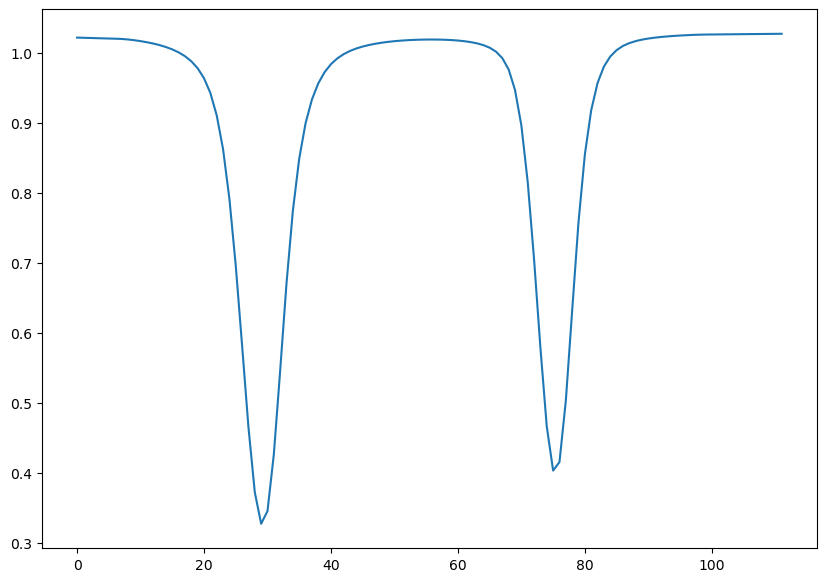

In [3]:
# I like first to calculte the mean spectrum and take a look at it:
mean_spectrum = np.mean(stokes,axis=(0,1))
plt.figure(figsize=[10,7])
plt.plot(mean_spectrum[0])

#### Looks good, where should we expect our maximum of polarization to be?

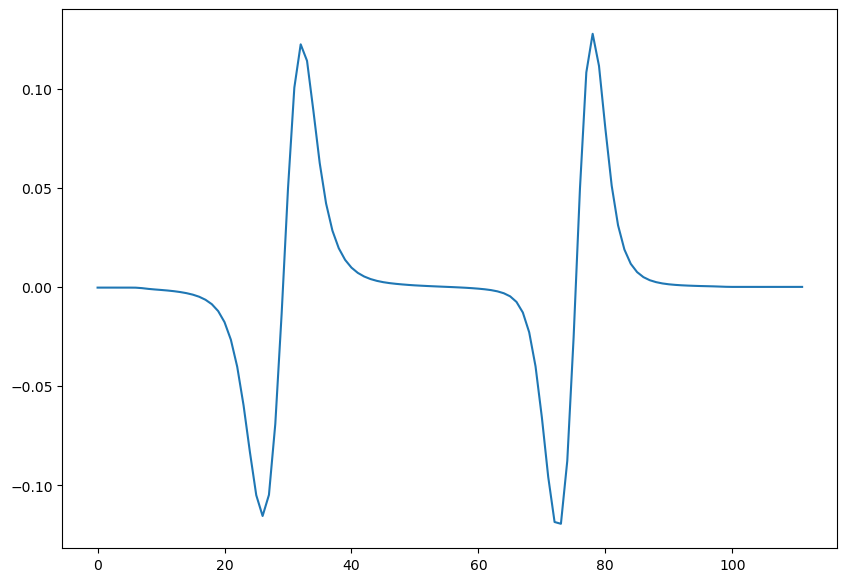

In [4]:
plt.figure(figsize=[10,7])
plt.plot(np.gradient(mean_spectrum[0]))

(20.0, 40.0)

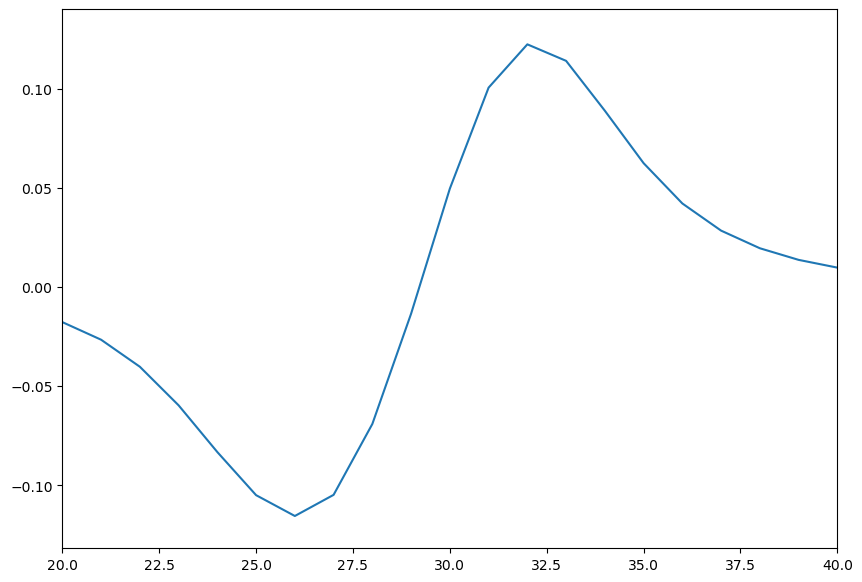

In [5]:
plt.figure(figsize=[10,7])
plt.plot(np.gradient(mean_spectrum[0]))
plt.xlim([20,40])

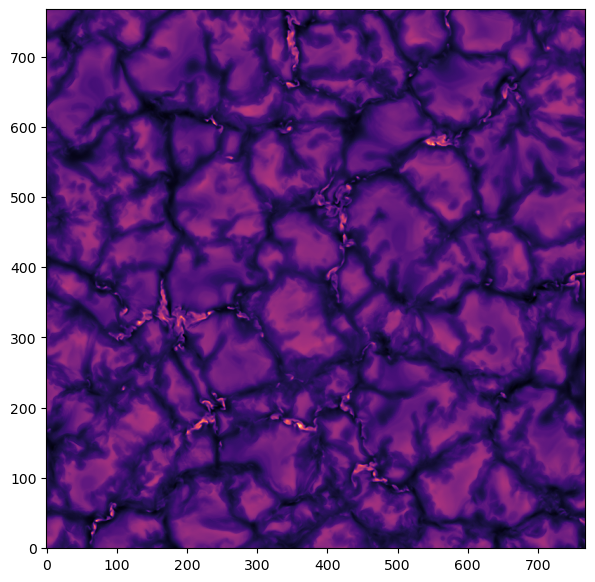

In [5]:
plt.figure(figsize=[10,7])
plt.imshow(stokes[:,:,0,0],origin='lower',cmap='magma')

In [3]:
# Everything looks good (actually this is the same thing as the one we studied on the first day)
# We will normalize our data as before
# Mean over all the spatial points and the last 10 wavelengths
mean_continuum = np.mean(stokes[:,:,0,-10:])

stokes /= mean_continuum


In [4]:
# Let's also assign wavelengths.
# We are using the same equation as previously.
# Technically, if you decide to use a separate dataset, you should look up wavelength scaling in 
# the fits header (HINODE), or you should have it provided somewhere else. You can even do you own 
# wavelength calibration

ll = np.linspace(0,111,112)
ll = 6302.08 + (ll-56.5)*0.0215

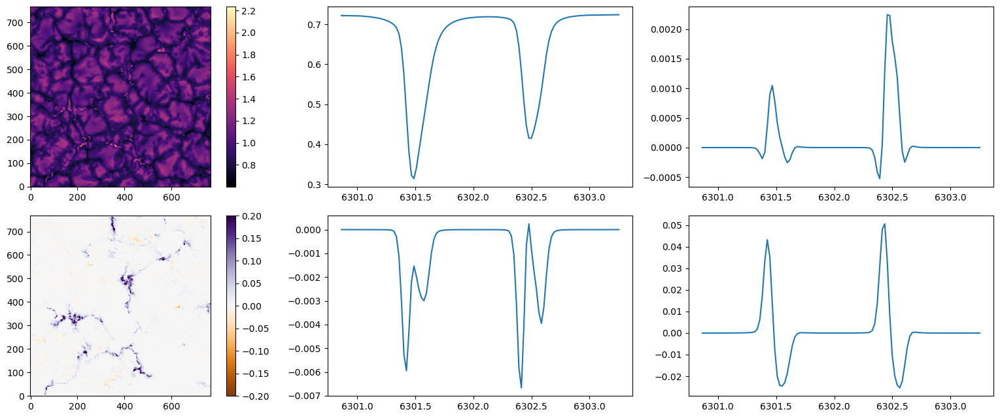

In [8]:
# Let's plot one example Stokes profile
i=50
j=100

plt.figure(figsize=[16,6.5])

plt.subplot(231)
plt.imshow(stokes[:,:,0,0],origin='lower',cmap='magma')
plt.colorbar()

plt.subplot(234)
plt.imshow(stokes[:,:,3,26],origin='lower',cmap='PuOr',vmin=-0.2,vmax=0.2)
plt.colorbar()

plt.subplot(232)
plt.plot(ll,stokes[i,j,0])
plt.subplot(233)
plt.plot(ll,stokes[i,j,1])
plt.subplot(235)
plt.plot(ll,stokes[i,j,2])
plt.subplot(236)
plt.plot(ll,stokes[i,j,3])
plt.tight_layout()

### Ok what do you see here? Can someone comment on the shapes of the lines and the magnitudes of Stokes parameters? What do you think?

In [9]:
# Now we are going to try to invert that one spectra. 
# Inverting is fitting with M-E model.
# Let's try one line at the time. 

# What are the problems with inverting both lines simultaneously, can you discuss?
# We define wavelength regions. We will soon see what None refers to ;)

# We are inverting only the first one
regions = [[ll[:50], None]]

# These are the lines
lines   = [6301]
# so now our code has wavelength grid and knows what to do

me = MilneEddington.MilneEddington(regions, lines, nthreads=1)

line::line: Initialized [6301.499500] ->  12 Zeeman components


In [47]:
# Here we estimate the noise .........

(array([2.0000e+00, 6.0000e+00, 1.0000e+01, 2.6000e+01, 5.1000e+01,
        7.7000e+01, 9.4000e+01, 1.2800e+02, 1.6900e+02, 2.3400e+02,
        3.2000e+02, 4.5500e+02, 7.6000e+02, 1.2990e+03, 2.0430e+03,
        3.6090e+03, 1.0250e+04, 4.0262e+04, 2.3957e+04, 8.2670e+03,
        3.9450e+03, 2.0490e+03, 9.1800e+02, 4.6200e+02, 2.3600e+02,
        1.4300e+02, 8.2000e+01, 6.4000e+01, 3.7000e+01, 1.4000e+01,
        7.0000e+00, 7.0000e+00, 3.0000e+00, 3.0000e+00, 1.0000e+00,
        2.0000e+00, 1.0000e+00, 2.0000e+00, 0.0000e+00, 1.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
        0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([-3.41297797e-04, -3.22131178e-04, -3.02964530e-04, -2.83797912e-04,
        -2.64631293e-04, -2.45464646e-04, -2.26298027e-04, -2.07131394e-04,
        -1.87964775e-04, -1.68798142e-04, -1.49631509e-04, -1.30464890e-04,
        -1.11298257e-04, -9.21316241e-05, -7.29649983e-05, -5.37983688e-05,
        -3.463

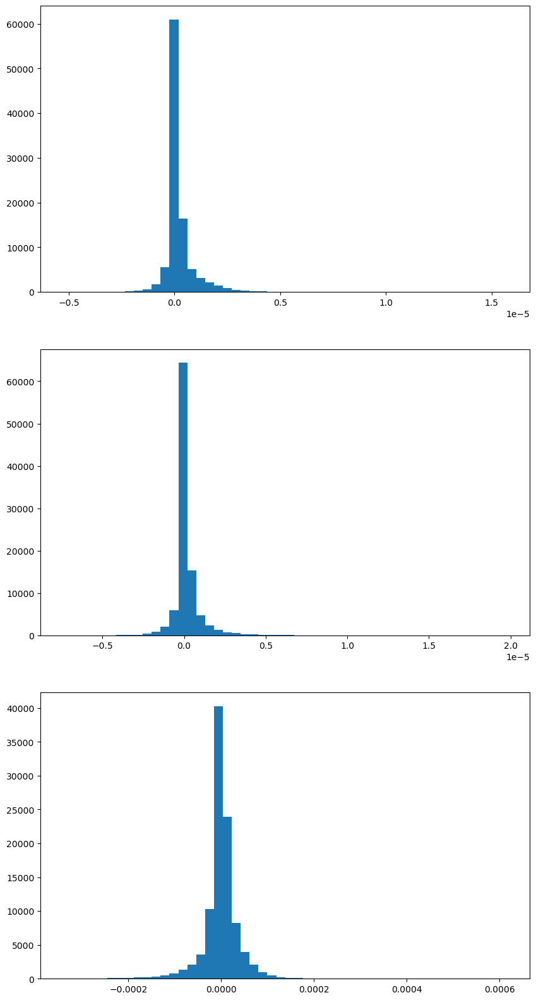

In [10]:
noise_Q = stokes[-100:,-100:,1,-10:]
noise_U = stokes[-100:,-100:,2,-10:]
noise_V = stokes[-100:,-100:,3,-10:]
plt.figure(figsize=[10,20])
plt.subplot(311)
plt.hist(noise_Q.flatten(),bins=50)
plt.subplot(312)
plt.hist(noise_U.flatten(),bins=50)
plt.subplot(313)
plt.hist(noise_V.flatten(),bins=50)

In [11]:
print ('sigma for Q is : ',np.std(noise_Q))
print ('sigma for U is : ',np.std(noise_U))
print ('sigma for V is : ',np.std(noise_V))

sigma for Q is :  7.547048e-07
sigma for U is :  8.485773e-07
sigma for V is :  3.813084e-05


#### Scaling w.r.t wavelength and continuum intensity (e.g. for a spot)...

In [12]:

# We learned yesterday that we need an estimate of the error uncertanties, we need to specify the noise
noise_level = 1.5e-3
noise = np.zeros((4, me.get_wavelength_array().size), dtype='float64', order='c')
noise += noise_level

#noise[0] *= 10. #noise is typicaly larger for I, because of systematics - Discuss!
noise[1] /= 10. #noise is typicaly larger for I, because of systematics - Discuss!
noise[2] /= 10. #noise is typicaly larger for I, because of systematics - Discuss!
noise[3] /= 10. #noise is typicaly larger for I, because of systematics - Discuss!

In [13]:
# We are going to get used to deal with number of pixels, so here are some new variables for you :)
nx = 1
ny = 1
model_guess = np.float64([500., 0.1, 0.1, 0.0, 0.04, 100, 0.5, 0.1, 1.0])

# This creates nx x ny clones of model_guess
models_guess  = me.repeat_model(model_guess, nx, ny)

# What are we fitting, one Stokes profile, but remember the form it has to go in (nx x ny x 4 x n_lambda)
to_fit = stokes[i,j,:,:50].reshape(1,1,4,50)
    
#
# This is where the inversion happens:
#
model_out, syn_out, chi2 = me.invert(models_guess, to_fit, noise, nRandom = 20, nIter=100, chi2_thres=1.0, verbose=False)


InvertMany: Processed -> 100%


In [14]:
# Let's, for the sanity's sake, print out the quantities:
print ('B:', model_out[0,0,0])
print ('inc:', model_out[0,0,1]*180./np.pi)
print ('azi:', model_out[0,0,2]*180./np.pi)
print ('v:', model_out[0,0,3])
print ('Chi-squared = ',chi2)

B: 462.8598970203849
inc: 54.631936995205265
azi: 130.22920791904852
v: -0.4564407223757465
Chi-squared =  [[218.75071464]]


$\chi^2$ is around 1, which is a good sign, the best way to see the fit, is to plot!

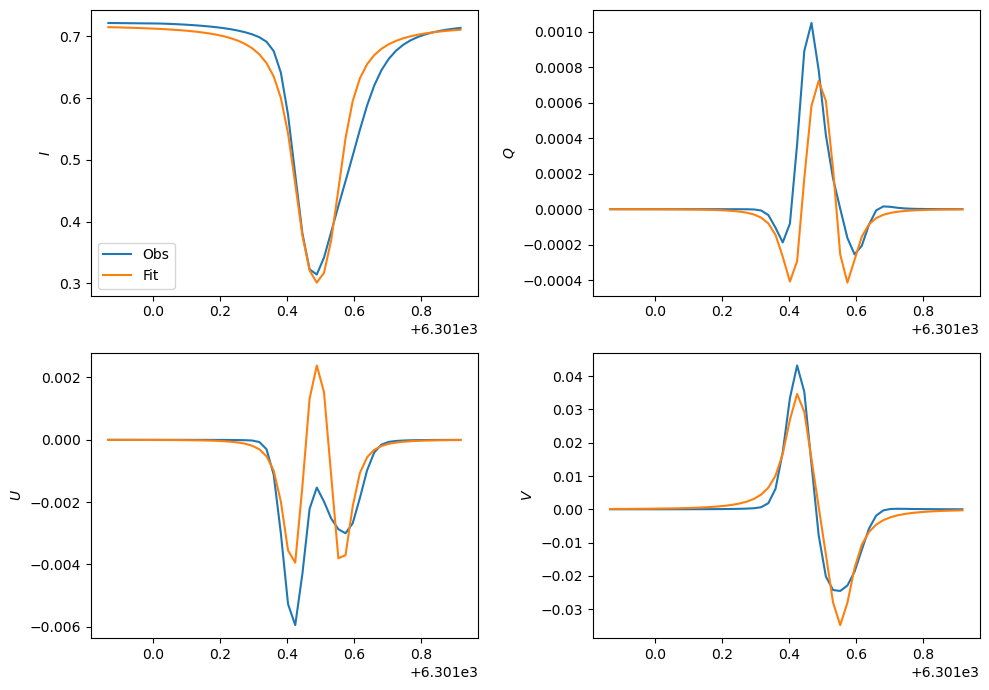

In [15]:
#test the plot
plt.figure(figsize=[10,7])
plt.subplot(221)
plt.plot(ll[:50],to_fit[0,0,0],label='Obs')
plt.plot(ll[:50],syn_out[0,0,0],label='Fit')
plt.ylabel("$I$")
plt.legend()
plt.subplot(222)
plt.plot(ll[:50],to_fit[0,0,1],label='Obs')
plt.plot(ll[:50],syn_out[0,0,1],label='Fit')
plt.ylabel("$Q$")
plt.subplot(223)
plt.plot(ll[:50],to_fit[0,0,2],label='Obs')
plt.plot(ll[:50],syn_out[0,0,2],label='Fit')
plt.ylabel("$U$")
plt.subplot(224)
plt.plot(ll[:50],to_fit[0,0,3],label='Obs')
plt.plot(ll[:50],syn_out[0,0,3],label='Fit')
plt.ylabel("$V$")
plt.tight_layout()

#### Looks good! 

Now, spend some time fitting individual pixels and looking what happens there!


After you are dont with that, we can move on and fit a part of field of view (or the whole one, if you have a nice pc)

In [16]:
# First part is to make use of the parallel capabilities of modern processors and do this with
# multiple threads
me = MilneEddington.MilneEddington(regions, lines, nthreads=8)

pyMilne::dealloc: cleaning-up...


line::line: Initialized [6301.499500] ->  12 Zeeman components


In [17]:
%%time 
# This will tell us how much time we use

# Now we are going to select a region:
i = 200 # we start from here
j = 100 
nx = 200 # and take this big chunk
ny = 200

# The same as before
model_guess = np.float64([500., 0.1, 0.1, 0.0, 0.04, 100, 0.5, 0.1, 1.0])
# Now we have 200 x 200 clones. In principle they don't have to be the same! 
models_guess  = me.repeat_model(model_guess, nx, ny)

# Select a Stokes subset to fit:
to_fit = stokes[i:i+nx,j:j+ny,:,:50].reshape(nx,ny,4,50)

# This is where the inversion happens, be mindful it will take some time
#
model_out, syn_out, chi2 = me.invert(models_guess, to_fit, noise, nRandom = 20, nIter=50, chi2_thres=1.0, verbose=False)

CPU times: user 20min 17s, sys: 1.14 s, total: 20min 18s
Wall time: 5min 38s


InvertMany: Processed -> 100%


In [29]:
print(model_out.shape)
print(chi2.shape)
#model_out = model_out.reshape(nx,ny,9)

(200, 200, 9)
(200, 200)


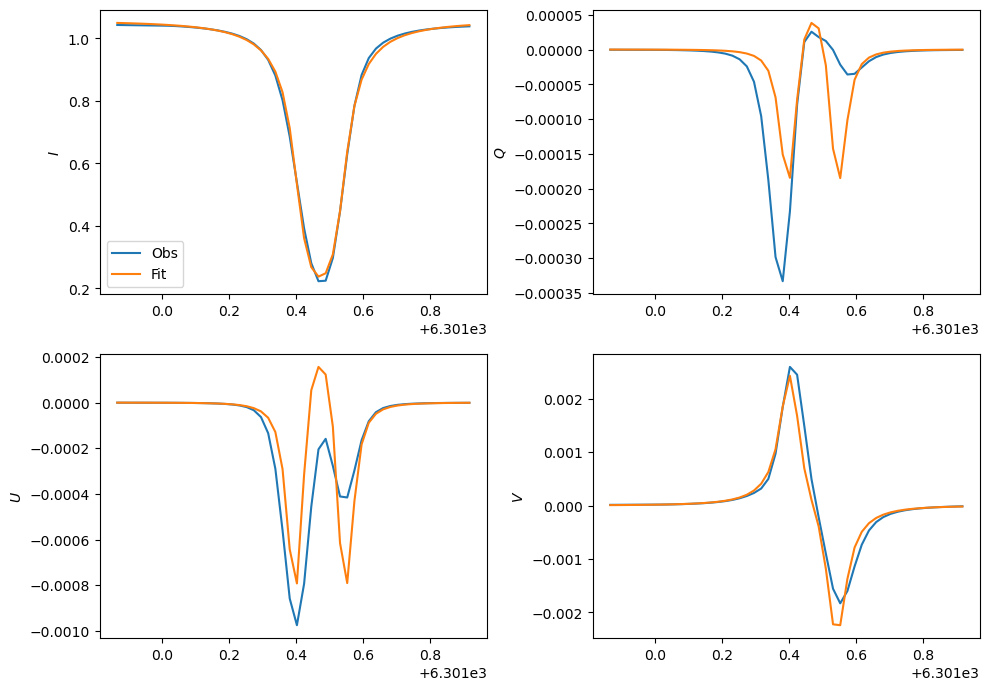

In [70]:
#test the plot
plt.figure(figsize=[10,7])
plt.subplot(221)
plt.plot(ll[:50],to_fit[0,0,0],label='Obs')
plt.plot(ll[:50],syn_out[0,0,0],label='Fit')
plt.ylabel("$I$")
plt.legend()
plt.subplot(222)
plt.plot(ll[:50],to_fit[0,0,1],label='Obs')
plt.plot(ll[:50],syn_out[0,0,1],label='Fit')
plt.ylabel("$Q$")
plt.subplot(223)
plt.plot(ll[:50],to_fit[0,0,2],label='Obs')
plt.plot(ll[:50],syn_out[0,0,2],label='Fit')
plt.ylabel("$U$")
plt.subplot(224)
plt.plot(ll[:50],to_fit[0,0,3],label='Obs')
plt.plot(ll[:50],syn_out[0,0,3],label='Fit')
plt.ylabel("$V$")
plt.tight_layout()

Well well well, look at that. Our parameters are also a cube now. And we even have a separate $\chi^2$ for each pixel! Looks great. Let's start by plotting $\chi^2$ map:

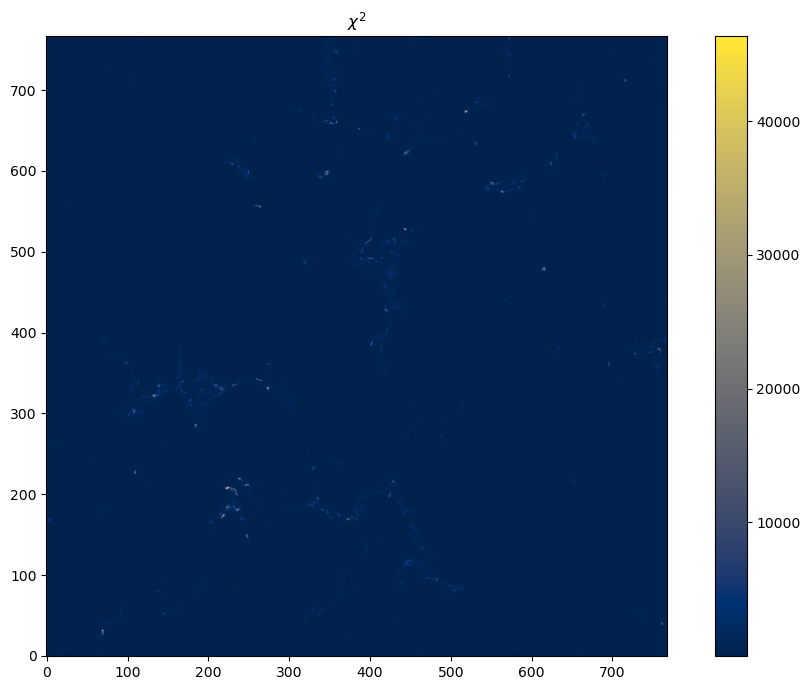

In [41]:
plt.figure(figsize=[10,7])
plt.imshow(chi2,cmap='cividis',origin='lower')
plt.title("$\chi^2$")
plt.colorbar()
plt.tight_layout()

In [42]:
np.mean(chi2)

85.47851556339684

Not bad, not bad. Seems like most of the pixels have $\chi^2$ of a few, while some number of pixels has somewhat larger values. 

Probably nothing to be worried about as we already know that our model is, striclty speaking, not correct! 

Velocity gradients, magnetic field gradients and other intricancies of radiative transfer lead to the departures. 

Now, let's plot some parameter maps:

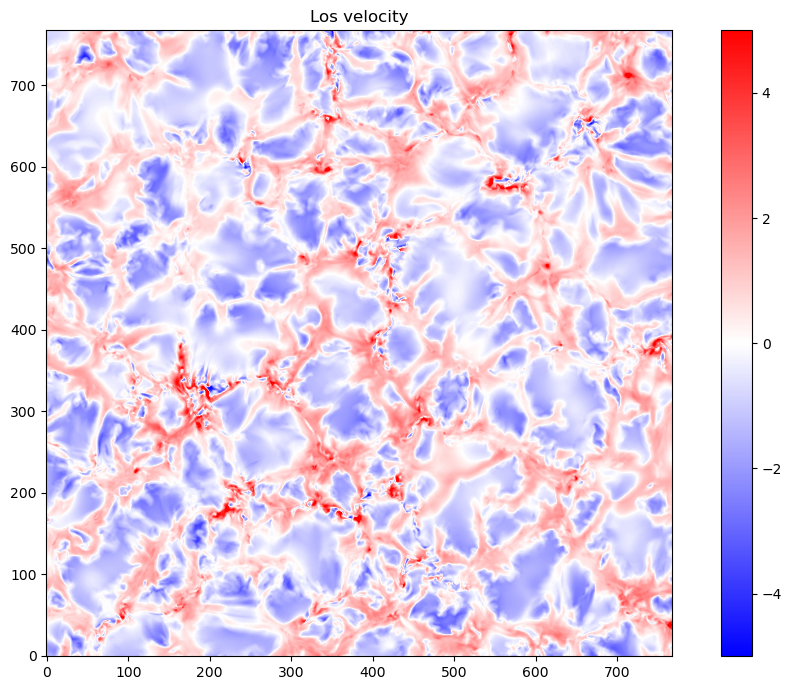

In [50]:
# The easiest sanity check for this is the velocity:
# Velocity is often normalized w.r.t the mean value 
plt.figure(figsize=[10,7])
plt.imshow(model_out[:,:,3],cmap='bwr',origin='lower',vmin=-5,vmax=5)
plt.title("Los velocity")
plt.colorbar()
plt.tight_layout()

Looks good! We see some structure on granular scale, and so on, let's look at the magnetic field strength:

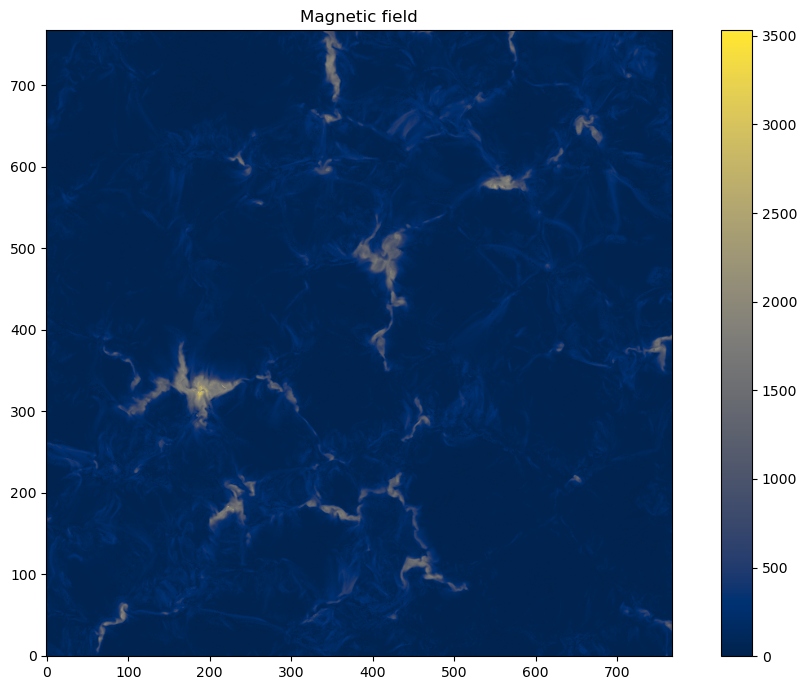

In [51]:
plt.figure(figsize=[10,7])
plt.imshow(model_out[:,:,0],cmap='cividis',origin='lower')
plt.title("Magnetic field")
plt.colorbar()
plt.tight_layout()

In [45]:
np.mean(model_out[:,:,0])

107.6893541473168

Interesting! We see a magnetic field structure that would perhaps resemble something as "network".
Even more interesting, the magnetic field structure corresponds to bad fits. Can you think why that is?

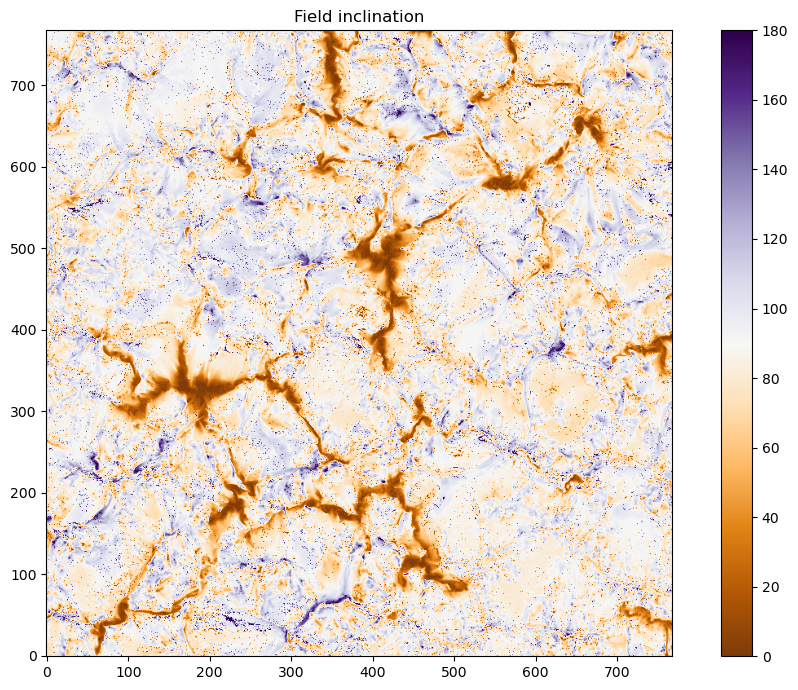

In [46]:
plt.figure(figsize=[10,7])
plt.imshow(model_out[:,:,1]*180./np.pi,cmap='PuOr',origin='lower')
plt.title("Field inclination")
plt.colorbar()
plt.tight_layout()

Here we, for the first time, see an interesting effect - salt and pepper noise. Namely, at some points magnetic field is so low that we cannot really judge the inclination so well. Actually, there is a very good reason why in the most non-magnetic pixels, inclination is close to 90... Can you think of that? 

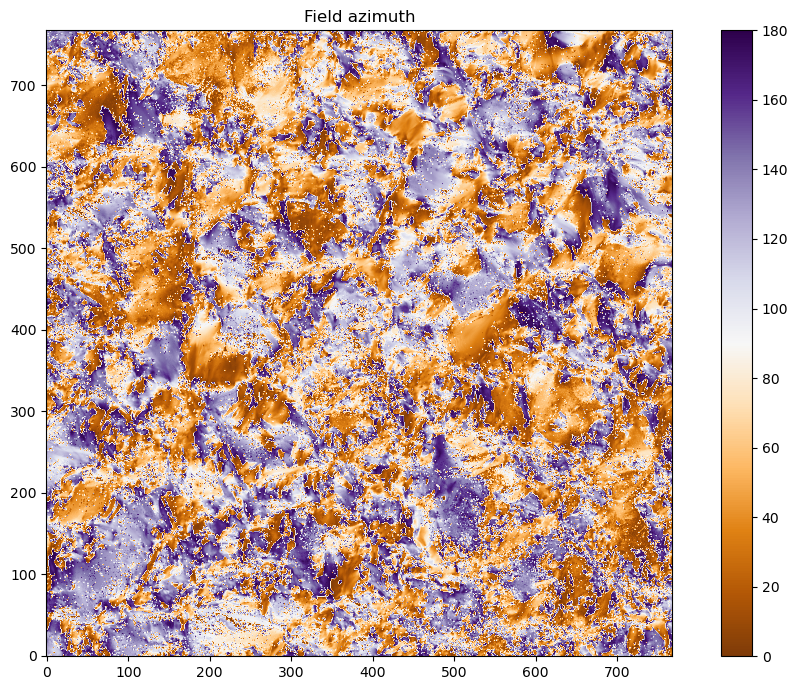

In [47]:
plt.figure(figsize=[10,7])
plt.imshow(model_out[:,:,2]*180./np.pi,cmap='PuOr',origin='lower')
plt.title("Field azimuth")
plt.colorbar()
plt.tight_layout()

This is now a complete mess! Excet for the network regions. Can you explain why? 

### Things to follow up with: 

1) Inversion with the other line 

2) Inversion with both the lines 

3) Further changing the weights 

4) Changing number of iterations, etc. 


In [48]:
# You might want to save these results for future use, to save a .fits file of the inverted parameters

# you can do something like this 
myhdu = fits.PrimaryHDU(model_out)
myhdu.writeto("inverted_models.fits",overwrite=True)

In [40]:
%%time 
# This will tell us how much time we use

# Now we are going to select a region:
i = 0 # we start from here
j = 0 
nx = 768 # and take this big chunk
ny = 768

# The same as before
model_guess = np.float64([500., 0.1, 0.1, 0.0, 0.04, 100, 0.5, 0.1, 1.0])
# Now we have 200 x 200 clones. In principle they don't have to be the same! 
models_guess  = me.repeat_model(model_guess, nx, ny)

# Select a Stokes subset to fit:
to_fit = stokes[i:i+nx,j:j+ny,:,:50].reshape(nx,ny,4,50)

# This is where the inversion happens, be mindful it will take some time
#
model_out, syn_out, chi2 = me.invert(models_guess, to_fit, noise, nRandom = 20, nIter=50, chi2_thres=1.0, verbose=False)

CPU times: user 4h 48min 31s, sys: 3.07 s, total: 4h 48min 34s
Wall time: 1h 13min


InvertMany: Processed -> 100%


In [52]:
stokes2 = fits.open('../data/convolved.fits')[0].data
stokes2.shape

(768, 768, 4, 112, 3)

In [54]:
mean_continuum2 = np.mean(stokes2[:,:,0,-10:,:])

stokes2 /= mean_continuum2

In [55]:
%%time 
# This will tell us how much time we use

# Now we are going to select a region:
i = 0 # we start from here
j = 0 
nx = 768 # and take this big chunk
ny = 768

# The same as before
model_guess2 = np.float64([500., 0.1, 0.1, 0.0, 0.04, 100, 0.5, 0.1, 1.0])
# Now we have 200 x 200 clones. In principle they don't have to be the same! 
models_guess2  = me.repeat_model(model_guess2, nx, ny)

# Select a Stokes subset to fit:
to_fit2 = stokes2[i:i+nx,j:j+ny,:,:50,0].reshape(nx,ny,4,50)

# This is where the inversion happens, be mindful it will take some time
#
model_out2, syn_out2, chi22 = me.invert(models_guess2, to_fit2, noise, nRandom = 20, nIter=20, chi2_thres=1.0, verbose=False)

CPU times: user 4h 8min 21s, sys: 3.35 s, total: 4h 8min 24s
Wall time: 1h 4min 5s


InvertMany: Processed -> 100%


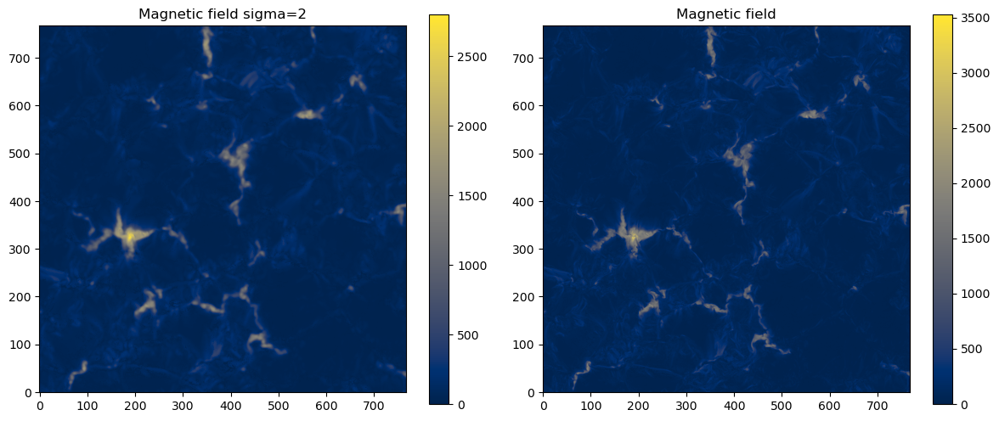

In [69]:
plt.figure(figsize=[12,5])
plt.subplot(121)
plt.imshow(model_out2[:,:,0],cmap='cividis',origin='lower')
plt.title("Magnetic field sigma=2")
plt.colorbar()
plt.subplot(122)
plt.imshow(model_out[:,:,0],cmap='cividis',origin='lower')
plt.title("Magnetic field")
plt.colorbar()
plt.tight_layout()

In [58]:
np.mean(model_out2[:,:,0])

102.1327095663233

In [66]:
print('The magnetic field is deceased by :',100*(1-np.mean(model_out2[:,:,0])/np.mean(model_out[:,:,0])),'%')

The magnetic field is deceased by : 5.159882910424118 %


In [67]:
myhdu = fits.PrimaryHDU(model_out2)
myhdu.writeto("inverted_models_sigma2.fits",overwrite=True)

In [71]:
np.mean(chi22)

45.889572458482064

### Inversion with data applied Gaussian filter.

In [42]:
stokes2 = fits.open('../data/convolved.fits')[0].data
mean_continuum2 = np.mean(stokes2[:,:,0,-10:,:])
stokes2 /= mean_continuum2

In [ ]:
%%time 
# This will tell us how much time we use
nx = 768 
ny = 768
# The same as before
model_guess2 = np.float64([500., 0.1, 0.1, 0.0, 0.04, 100, 0.5, 0.1, 1.0])
models_guess2  = me.repeat_model(model_guess2, nx, ny)

# Select a Stokes subset to fit:
to_fit2 = stokes2[:,:,:,:50,1].reshape(nx,ny,4,50)

# This is where the inversion happens, be mindful it will take some time
#
model_out2, syn_out2, chi22 = me.invert(models_guess2, to_fit2, noise, nRandom = 20, nIter=20, chi2_thres=1.0, verbose=False)

In [42]:
model = fits.open('inverted_models.fits')[0].data
model2 = fits.open('inverted_models_sigma2.fits')[0].data

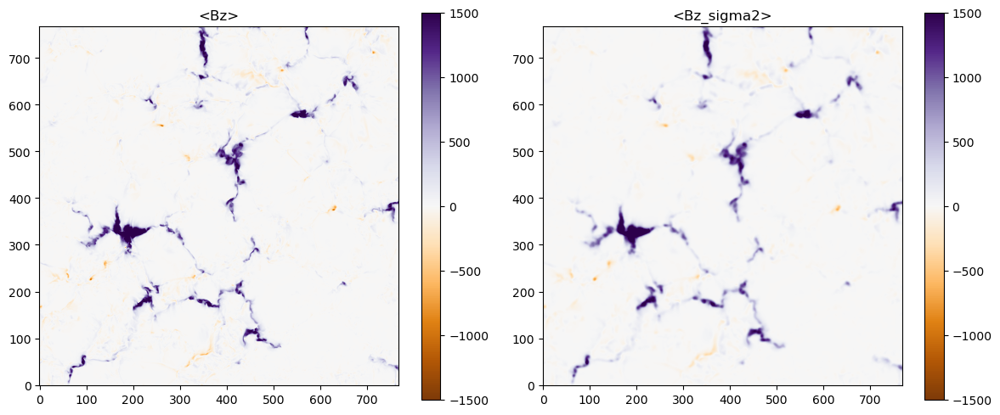

In [47]:
Bz = model[:,:,0]*np.cos(model[:,:,1])
Bz2 = model2[:,:,0]*np.cos(model2[:,:,1])
plt.figure(figsize=[12,5])
plt.subplot(121)
plt.imshow(Bz[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('<Bz>')
plt.colorbar()
plt.subplot(122)
plt.imshow(Bz2[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('<Bz_sigma2>')
plt.colorbar()
plt.tight_layout()

In [51]:
print(np.mean(Bz))
print(np.mean(Bz2))

36.429959371905085
37.87288593682421


In [55]:
print(np.mean(Bxy))
print(np.mean(Bxy2))

63.02774615807808
58.92008181964346


In [ ]:
model = fits.open('../data/qs_ph_disk_center_synth.hinodewvl_inverted.fits')[0].data
chi2 = fits.open('../data/qs_ph_disk_center_synth.hinodewvl_inverted.fits')[1].data

model2 = fits.open('../data/convolved_inverted.fits')[0].data
chi22 = fits.open('../data/convolved_inverted.fits')[1].data

model3 = fits.open('../data/convolved_sigma5_inverted.fits')[0].data
chi23 = fits.open('../data/convolved_sigma5_inverted.fits')[1].data

model4 = fits.open('../data/convolved_sigma10_inverted.fits')[0].data
chi24 = fits.open('../data/convolved_sigma10_inverted.fits')[1].data

In [85]:
Bz = model[:,:,0]*np.cos(model[:,:,1])
Bz2 = model2[:,:,0]*np.cos(model2[:,:,1])
Bz3 = model3[:,:,0]*np.cos(model3[:,:,1])
Bz4 = model4[:,:,0]*np.cos(model4[:,:,1])


Bz =  37.454695717166764
Bz_sigma2 =  38.38114972377469
Bz_sigma5 =  35.14718240898525
Bz_sigma10 =  28.381444968160164


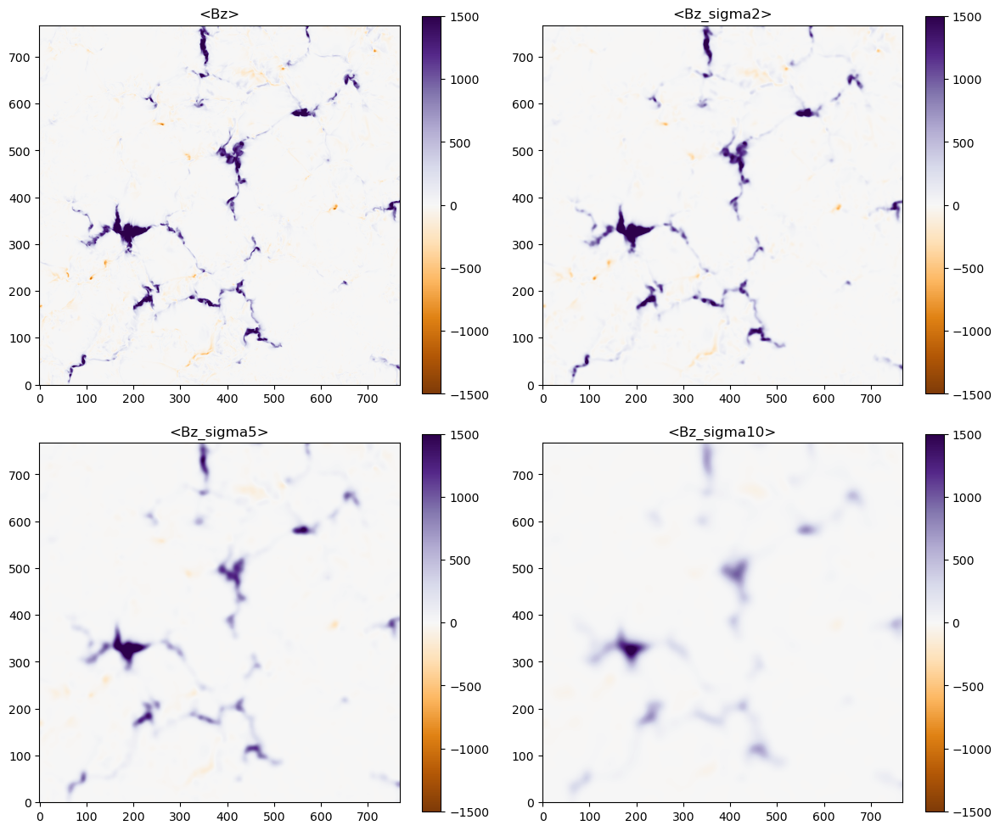

In [87]:
plt.figure(figsize=[12,10])
plt.subplot(221)
plt.imshow(Bz[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('<Bz>')
plt.colorbar()
plt.subplot(222)
plt.imshow(Bz2[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('<Bz_sigma2>')
plt.colorbar()
plt.subplot(223)
plt.imshow(Bz3[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('<Bz_sigma5>')
plt.colorbar()
plt.subplot(224)
plt.imshow(Bz4[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('<Bz_sigma10>')
plt.colorbar()
plt.tight_layout()
print('Bz = ',np.mean(Bz))
print('Bz_sigma2 = ',np.mean(Bz2))
print('Bz_sigma5 = ',np.mean(Bz3))
print('Bz_sigma10 = ',np.mean(Bz4))

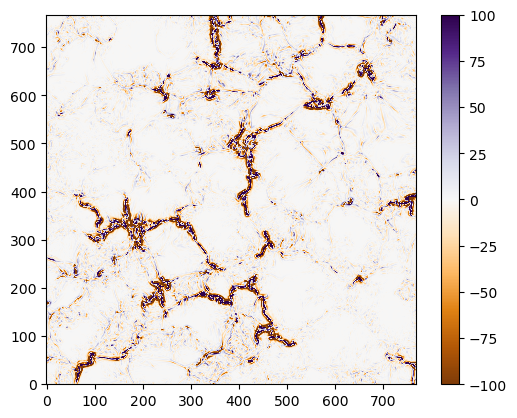

In [97]:
plt.imshow(Bz-Bz2,cmap='PuOr',origin='lower',vmin=-100,vmax=100)
plt.colorbar()

In [93]:
total = np.zeros(4)
total[0] = np.mean(Bz[:,:])
total[1] = np.mean(Bz2[:,:]) #sigma=2
total[2] = np.mean(Bz3[:,:]) #sigma=5
total[3] = np.mean(Bz4[:,:]) #sigma=10

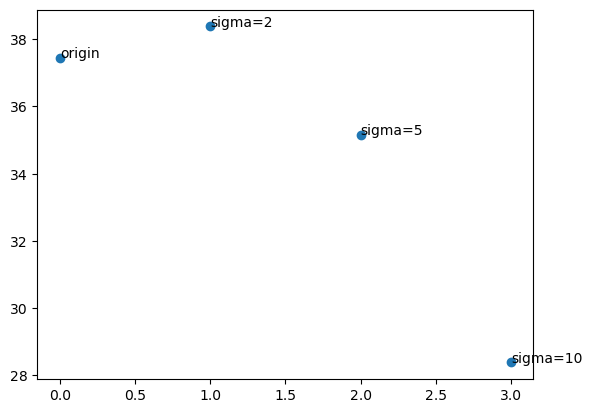

In [94]:
n=['origin','sigma=2','sigma=5','sigma=10']
x=[0,1,2,3]
plt.scatter(x,total)
for i, txt in enumerate(n):
    plt.annotate(txt, (x[i], total[i]))

In [90]:
Bh = model[:,:,0]*np.sin(model[:,:,2])
Bh2 = model2[:,:,0]*np.sin(model2[:,:,2])
Bh3 = model3[:,:,0]*np.sin(model3[:,:,2])
Bh4 = model4[:,:,0]*np.sin(model4[:,:,2])

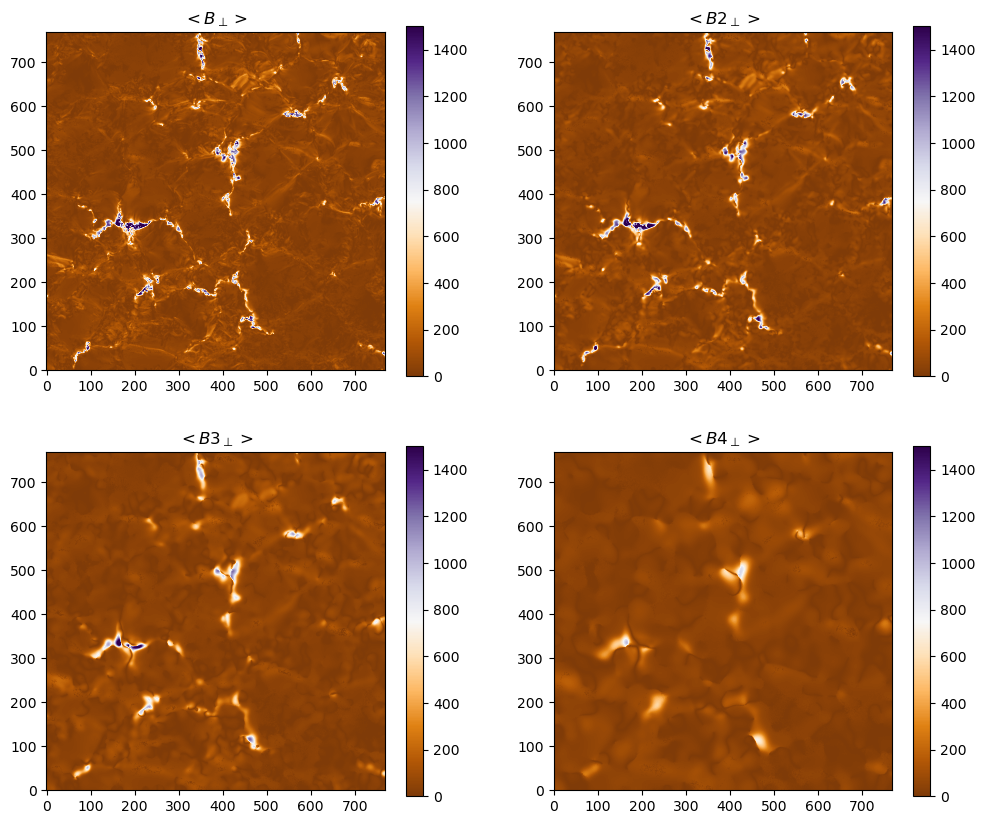

In [91]:
plt.figure(figsize=[12,10])
plt.subplot(221)
plt.imshow(Bh[:,:],cmap='PuOr',origin='lower',vmax=1500)
plt.title(r'$<B_\bot>$')
plt.colorbar()
plt.subplot(222)
plt.imshow(Bh2[:,:],cmap='PuOr',origin='lower',vmax=1500)
plt.title(r'$<B2_\bot>$')
plt.colorbar()
plt.subplot(223)
plt.imshow(Bh3[:,:],cmap='PuOr',origin='lower',vmax=1500)
plt.title(r'$<B3_\bot>$')
plt.colorbar()
plt.subplot(224)
plt.imshow(Bh4[:,:],cmap='PuOr',origin='lower',vmax=1500)
plt.title(r'$<B4_\bot>$')
plt.colorbar()

In [92]:
print('Bh = ',np.mean(Bh))
print('Bh_sigma2 = ',np.mean(Bh2))
print('Bh_sigma5 = ',np.mean(Bh3))
print('Bh_sigma10 = ',np.mean(Bh4))

Bh =  69.88689788436976
Bh_sigma2 =  67.256473513278
Bh_sigma5 =  60.403721207809895
Bh_sigma10 =  50.78532091593499


chisquare =  108.24293506739225
chisquare_sigma2 =  80.93697498916882
chisquare_sigma5 =  70.48329997936769
chisquare_sigma10 =  67.30366286110853


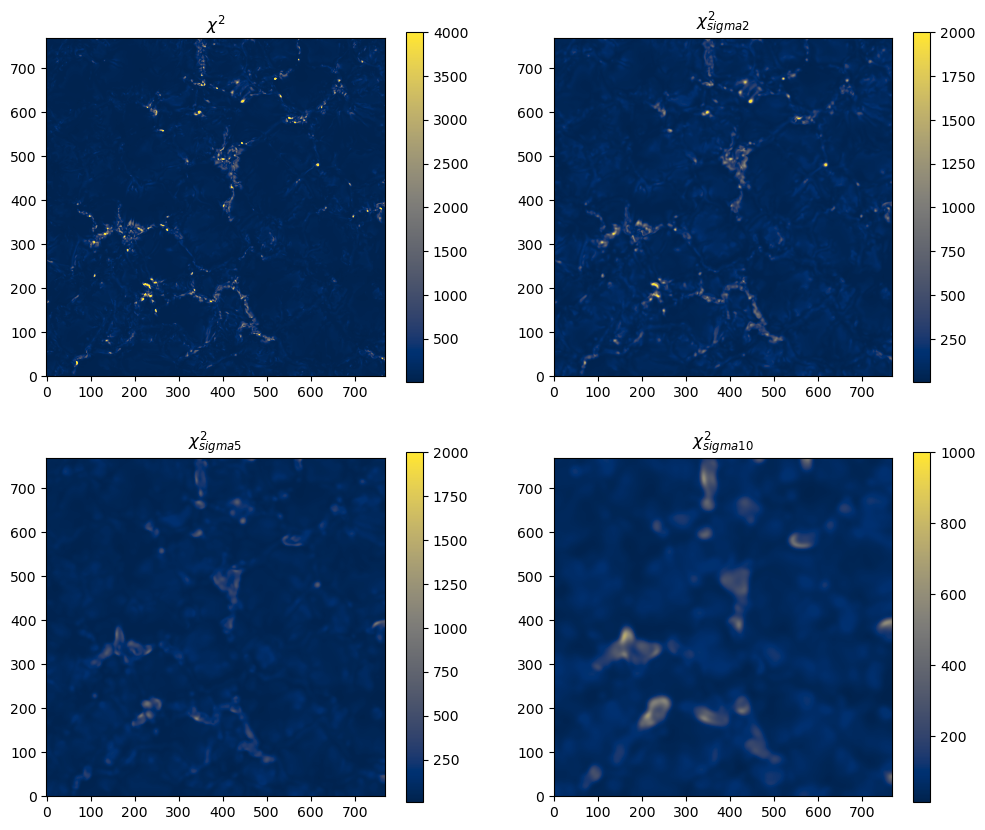

In [100]:
plt.figure(figsize=[12,10])
plt.subplot(221)
plt.imshow(chi2[:,:],cmap='cividis',origin='lower',vmax=4000)
plt.title('$\chi^2$')
plt.colorbar()
plt.subplot(222)
plt.imshow(chi22[:,:],cmap='cividis',origin='lower',vmax=2000)
plt.title('$\chi^2_{sigma2}$')
plt.colorbar()
plt.subplot(223)
plt.imshow(chi23[:,:],cmap='cividis',origin='lower',vmax=2000)
plt.title('$\chi^2_{sigma5}$')
plt.colorbar()
plt.subplot(224)
plt.imshow(chi24[:,:],cmap='cividis',origin='lower',vmax=1000)
plt.title('$\chi^2_{sigma10}$')
plt.colorbar()
print('chisquare = ',np.mean(chi2))
print('chisquare_sigma2 = ',np.mean(chi22))
print('chisquare_sigma5 = ',np.mean(chi23))
print('chisquare_sigma10 = ',np.mean(chi24))

### Prepare PSF and do the convolution.

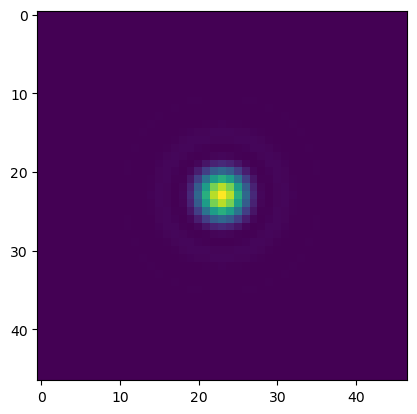

In [6]:
#prepare the PSF
D = 1.0 #m
llambda = 500e-9
pix_size = 16e3 #m
pixel_scale_arcsec = 16e3 / 725e3
diff_limit_arcsec = 1.22 * llambda / D * 206265
diff_limit_pixels = diff_limit_arcsec / pixel_scale_arcsec

PSF = apconv.AiryDisk2DKernel(diff_limit_pixels, mode='oversample')
plt.imshow(PSF)

In [6]:
stokes = fits.open('../data/qs_ph_disk_center_synth.hinodewvl.fits')[0].data
stokes.shape

(768, 768, 4, 112)

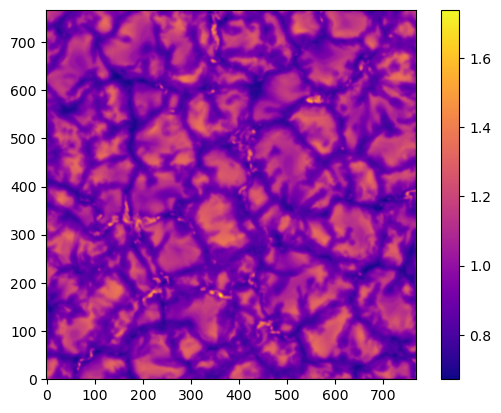

In [7]:

test = apconv.convolve_fft(stokes[:,:,0,0],PSF,boundary='wrap',normalize_kernel=True)
test /= np.mean(stokes[:,:,0,0])
plt.imshow(test,origin='lower',cmap='plasma')
plt.colorbar()

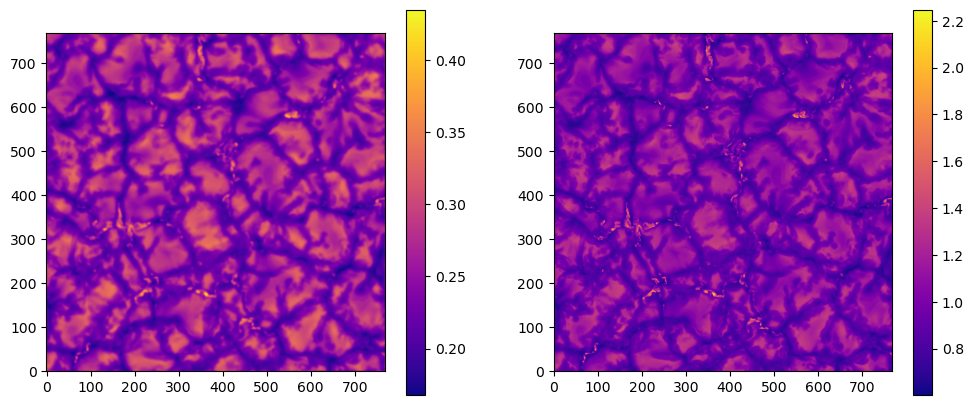

In [130]:
testb = np.sum(test.reshape(768,1,768,1),axis=(1,3))/4.0
plt.figure(figsize=[12,5])
plt.subplot(121)
plt.imshow(testb,origin='lower',cmap='plasma')
plt.colorbar()
plt.subplot(122)
plt.imshow(stokes[:,:,0,0]/np.mean(stokes[:,:,0,0]),origin='lower',cmap='plasma')
plt.colorbar()

In [7]:
convolve = np.zeros([768,768,4,112])
cb = np.zeros([384,384,4,112])
for i in range(4):
    for j in range(112):
        convolve[:,:,i,j] = apconv.convolve_fft(stokes[:,:,i,j],PSF,boundary='wrap',normalize_kernel=True)
        cb[:,:,i,j] = np.sum(convolve[:,:,i,j].reshape(384,2,384,2),axis=(1,3))/4.0

In [8]:
#cb = np.sum(convolve[:,:,0,0].reshape(384,2,384,2),axis=(1,3))/4.0
cb.shape

(384, 384, 4, 112)

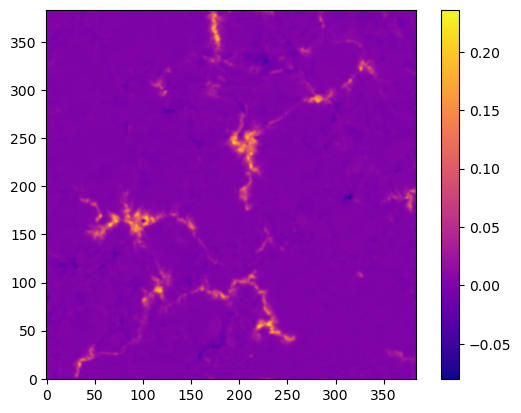

In [9]:
plt.imshow(cb[:,:,3,26],origin='lower',cmap='plasma')
plt.colorbar()

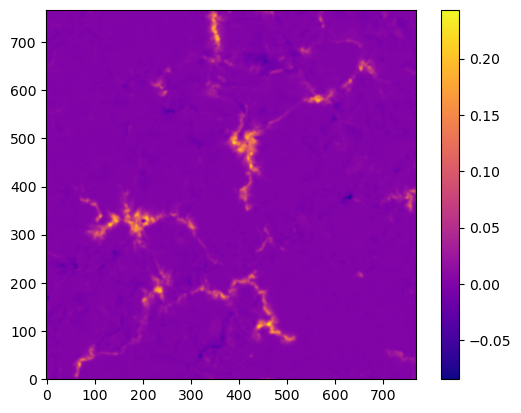

In [10]:
plt.imshow(convolve[:,:,3,26],origin='lower',cmap='plasma')
plt.colorbar()

In [12]:
hdu1 = fits.PrimaryHDU(convolve)
hdu2 = fits.ImageHDU(cb)
hdulist = fits.HDUList([hdu1,hdu2])
hdulist.writeto('PSFconverted.fits',overwrite=True)

### Run the inversion code, compare the data with and without PSF.
### First try with previous data.

In [2]:
model = fits.open('../data/qs_ph_disk_center_synth.hinodewvl_inverted.fits')[0].data
chi2 = fits.open('../data/qs_ph_disk_center_synth.hinodewvl_inverted.fits')[1].data
model2 = fits.open('PSFconverted_inverted.fits')[0].data
chi22 = fits.open('PSFconverted_inverted.fits')[1].data

In [3]:
Bz = model[:,:,0]*np.cos(model[:,:,1])
Bz2 = model2[:,:,0]*np.cos(model2[:,:,1])

Bz =  37.454695717166764
Bz_PSF =  37.35317708878315


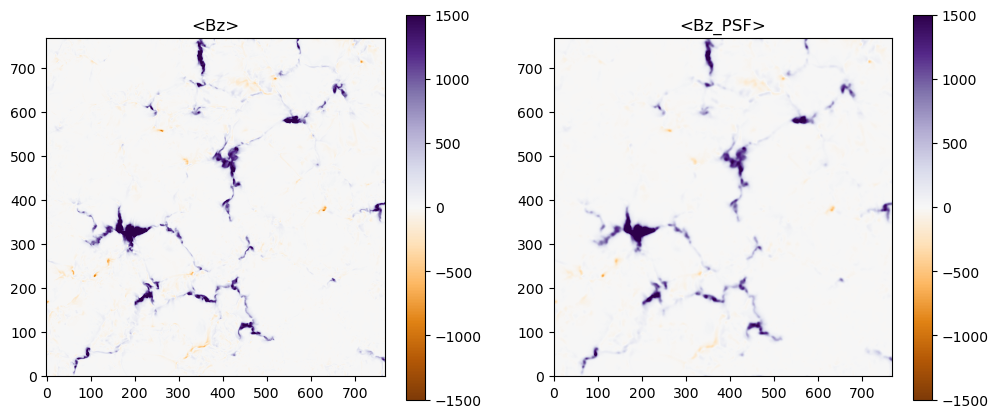

In [4]:
plt.figure(figsize=[12,5])
plt.subplot(121)
plt.imshow(Bz[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('<Bz>')
plt.colorbar()
plt.subplot(122)
plt.imshow(Bz2[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('<Bz_PSF>')
plt.colorbar()
print('Bz = ',np.mean(Bz))
print('Bz_PSF = ',np.mean(Bz2))

### test for PSF convolution. (takes too much time, moves to the server.)

In [19]:
stokes = fits.open('../data/qs_ph_disk_center_synth.fits')[0].data
stokes.shape

(1536, 1536, 4, 201)

In [ ]:
stokes /=np.mean(stokes[:,:,0,-10])

In [ ]:
convolve = np.zeros([1536,1536,4,201])
cb = np.zeros([768,768,4,201])
for i in range(4):
    for j in range(201):
        convolve[:,:,i,j] = apconv.convolve_fft(stokes[:,:,i,j],PSF,boundary='wrap',normalize_kernel=True)
        cb = np.sum(convolve[:,:,i,j].reshape(768,2,768,2),axis=(1,3))/4.0

### Here is the inverted data.  

In [2]:
model = fits.open('../data/qs_ph_disk_center_synth_inverted.fits')[0].data
chi2 = fits.open('../data/qs_ph_disk_center_synth_inverted.fits')[1].data
model2 = fits.open('../data/qs_ph_disk_center_synth_converted_inverted.fits')[0].data
chi22 = fits.open('../data/qs_ph_disk_center_synth_converted_inverted.fits')[1].data

In [3]:
Bz = model[:,:,0]*np.cos(model[:,:,1])
Bz2 = model2[:,:,0]*np.cos(model2[:,:,1])

Bz =  33.052626571119205
Bz_PSF =  33.07930170730908


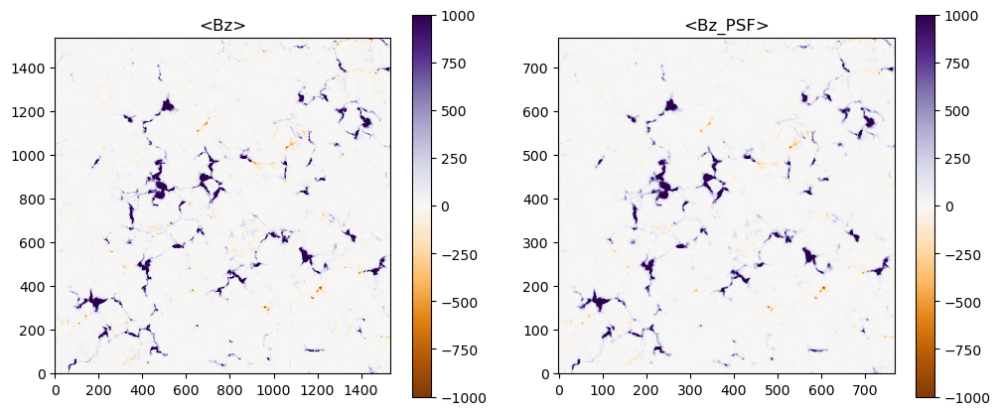

In [4]:
plt.figure(figsize=[12,5])
plt.subplot(121)
plt.imshow(Bz[:,:],cmap='PuOr',origin='lower',vmin=-1000,vmax=1000)
plt.title('<Bz>')
plt.colorbar()
plt.subplot(122)
plt.imshow(Bz2[:,:],cmap='PuOr',origin='lower',vmin=-1000,vmax=1000)
plt.title('<Bz_PSF>')
plt.colorbar()
print('Bz = ',np.mean(Bz))
print('Bz_PSF = ',np.mean(Bz2))

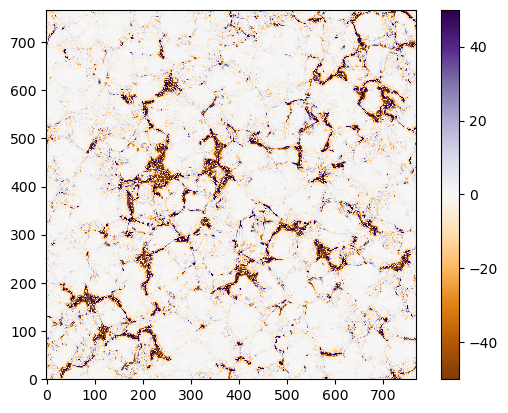

In [11]:
plt.imshow((np.sum(Bz[:,:].reshape(768,2,768,2),axis=(1,3))/4.0)-Bz2[:,:],cmap='PuOr',origin='lower',vmin=-50,vmax=50)
plt.colorbar()

In [8]:
Bh = model[:,:,0]*np.sin(model[:,:,2])
Bh2 = model2[:,:,0]*np.sin(model2[:,:,2])
print('Bh = ',np.mean(Bh))
print('Bh_PSF = ',np.mean(Bh2))

Bh =  55.02304784595786
Bh_PSF =  52.64796823143833


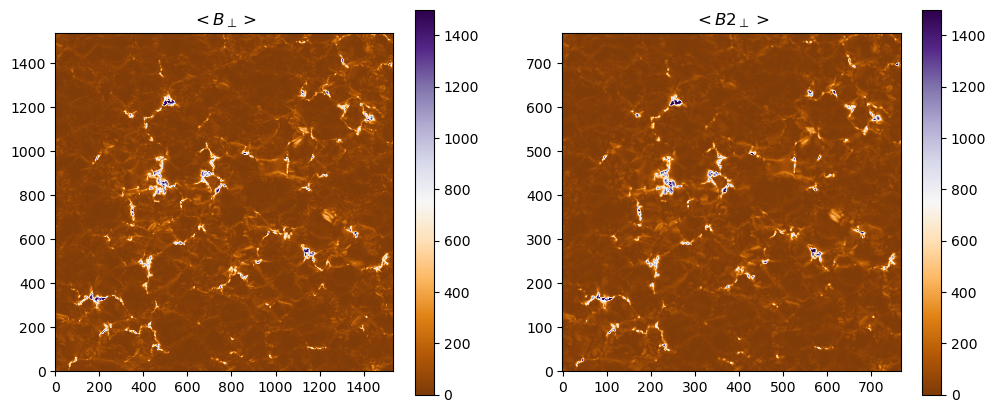

In [7]:
plt.figure(figsize=[12,5])
plt.subplot(121)
plt.imshow(Bh[:,:],cmap='PuOr',origin='lower',vmax=1500)
plt.title(r'$<B_\bot>$')
plt.colorbar()
plt.subplot(122)
plt.imshow(Bh2[:,:],cmap='PuOr',origin='lower',vmax=1500)
plt.title(r'$<B2_\bot>$')
plt.colorbar()

chisquare =  265.28698716854143
chisquare_sigma2 =  150.67484290647934


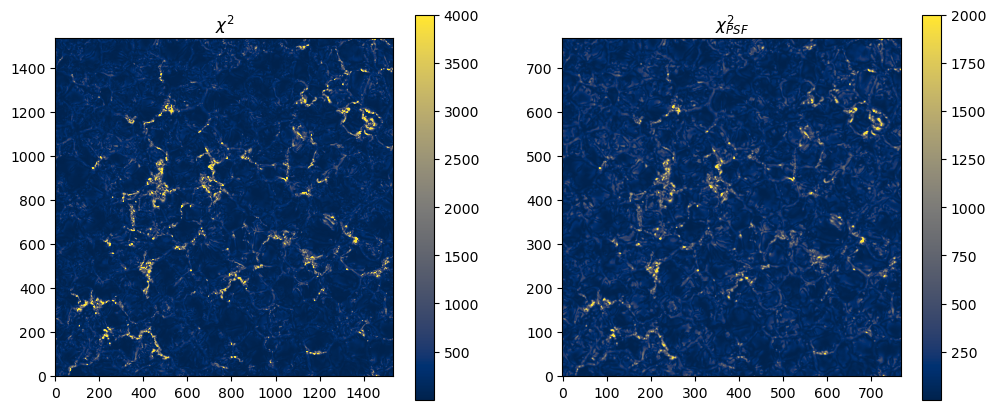

In [5]:
plt.figure(figsize=[12,5])
plt.subplot(121)
plt.imshow(chi2[:,:],cmap='cividis',origin='lower',vmax=4000)
plt.title('$\chi^2$')
plt.colorbar()
plt.subplot(122)
plt.imshow(chi22[:,:],cmap='cividis',origin='lower',vmax=2000)
plt.title('$\chi^2_{PSF}$')
plt.colorbar()

print('chisquare = ',np.mean(chi2))
print('chisquare_sigma2 = ',np.mean(chi22))

### Testing with larger datasets.

In [14]:
stokes = fits.open('../data/qs_ph_disk_center_synth_converted_0.2.fits')[0].data

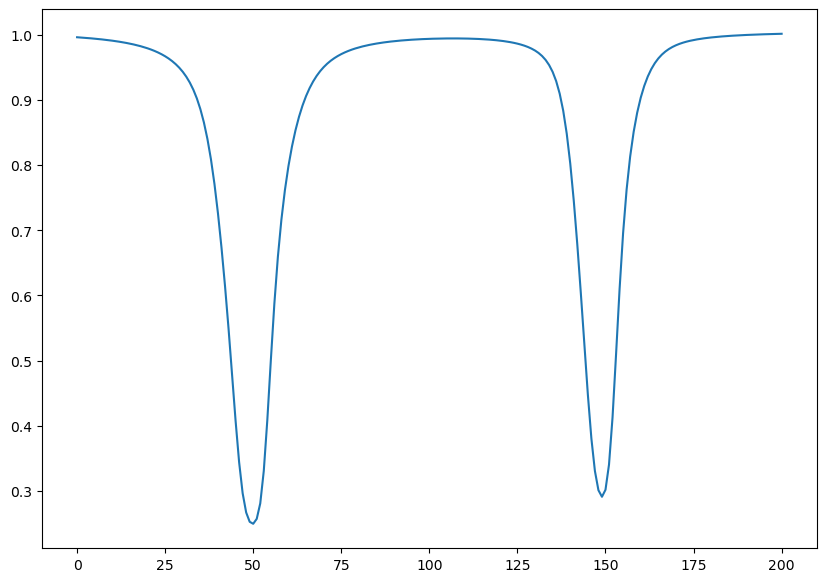

In [15]:
mean_spectrum = np.mean(stokes,axis=(0,1))
plt.figure(figsize=[10,7])
plt.plot(mean_spectrum[0])

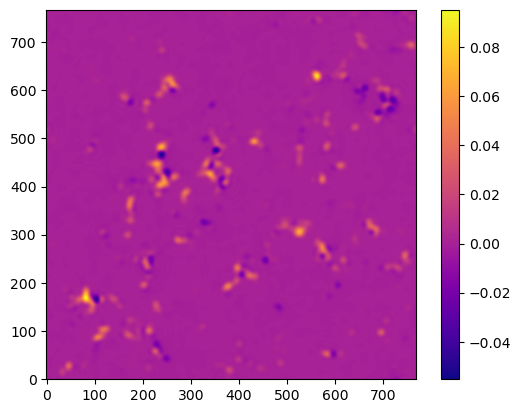

In [16]:
plt.imshow(stokes[:,:,3,50],origin='lower',cmap='plasma')
plt.colorbar()

In [37]:
model = fits.open('../data/qs_ph_disk_center_synth_inverted.fits')[0].data
chi2 = fits.open('../data/qs_ph_disk_center_synth_inverted.fits')[0].data

model1 = fits.open('../data/qs_ph_disk_center_synth_converted_0.1_inverted.fits')[0].data
chi21 = fits.open('../data/qs_ph_disk_center_synth_converted_0.1_inverted.fits')[1].data

model2 = fits.open('../data/qs_ph_disk_center_synth_converted_0.2_inverted.fits')[0].data
chi22 = fits.open('../data/qs_ph_disk_center_synth_converted_0.2_inverted.fits')[1].data

model3 = fits.open('../data/qs_ph_disk_center_synth_converted_0.5_inverted.fits')[0].data
chi23 = fits.open('../data/qs_ph_disk_center_synth_converted_0.5_inverted.fits')[1].data

model4 = fits.open('../data/qs_ph_disk_center_synth_converted_inverted.fits')[0].data
chi24 = fits.open('../data/qs_ph_disk_center_synth_converted_inverted.fits')[1].data

In [39]:
Bz = model[:,:,0]*np.cos(model[:,:,1])
Bz1 = model1[:,:,0]*np.cos(model1[:,:,1])
Bz2 = model2[:,:,0]*np.cos(model2[:,:,1])
Bz3 = model3[:,:,0]*np.cos(model3[:,:,1])
Bz4 = model4[:,:,0]*np.cos(model4[:,:,1])


Bz_0.1 =  33.052626571119205
Bz_0.2 =  23.597892968206196
Bz_0.5 =  30.753480937415368
Bz_1.0 =  33.07930170730908


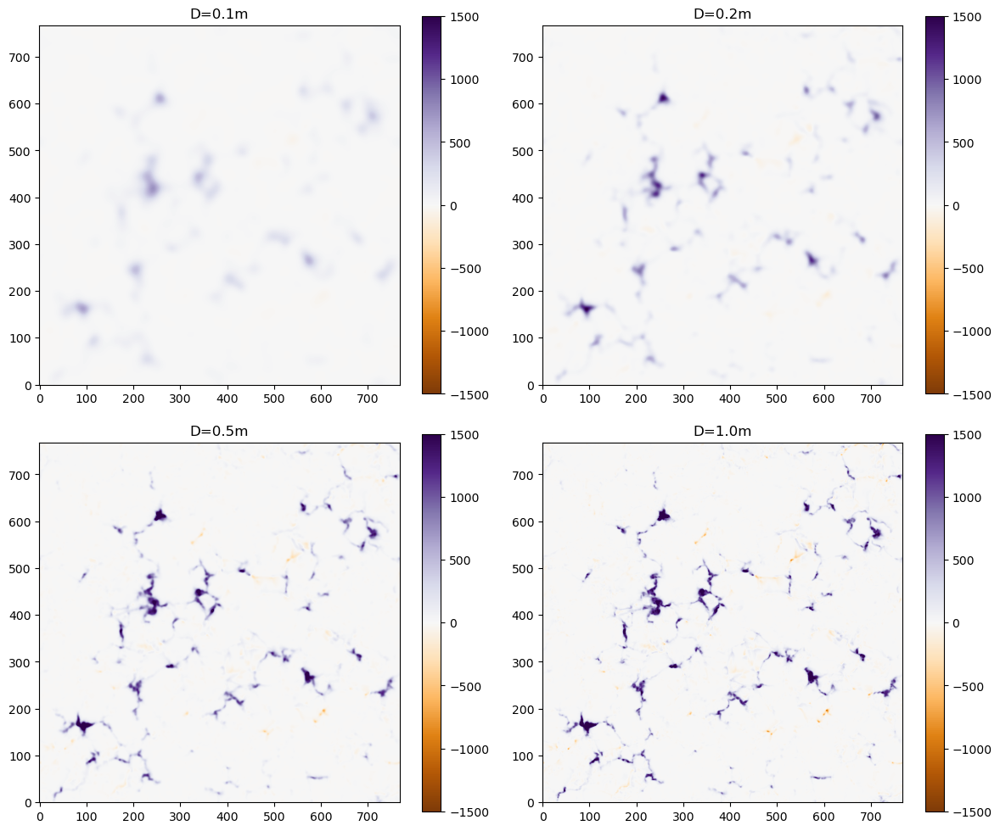

In [42]:
plt.figure(figsize=[12,10])
plt.subplot(221)
plt.imshow(Bz1[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('D=0.1m')
plt.colorbar()
plt.subplot(222)
plt.imshow(Bz2[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('D=0.2m')
plt.colorbar()
plt.subplot(223)
plt.imshow(Bz3[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('D=0.5m')
plt.colorbar()
plt.subplot(224)
plt.imshow(Bz4[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('D=1.0m')
plt.colorbar()
plt.tight_layout()
print('Bz_0.1 = ',np.mean(Bz))
print('Bz_0.2 = ',np.mean(Bz2))
print('Bz_0.5 = ',np.mean(Bz3))
print('Bz_1.0 = ',np.mean(Bz4))

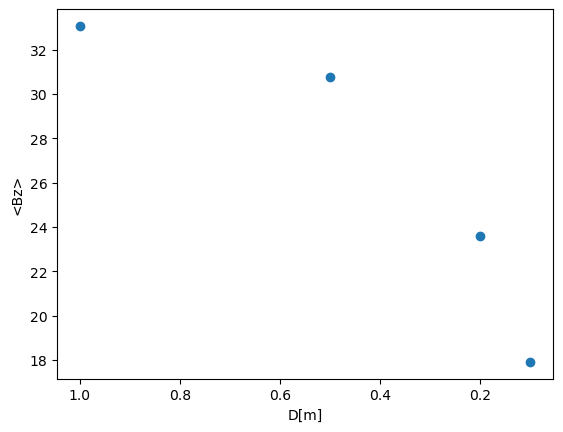

In [28]:
mean = np.zeros(4)
mean[0] = np.mean(Bz[:,:])  #0.1
mean[1] = np.mean(Bz2[:,:]) #0.2
mean[2] = np.mean(Bz3[:,:]) #0.5
mean[3] = np.mean(Bz4[:,:]) #1.0
#n=['0.1','0.2','0.5','1.0']
x=[0.1,0.2,0.5,1]
plt.scatter(x,total)
plt.xlabel('D[m]')
plt.ylabel('<Bz>')
plt.gca().invert_xaxis()
#for i, txt in enumerate(n):
#    plt.annotate(txt, (x[i], total[i]))

In [29]:
1-mean[1]/mean[3]

0.286626629032133

In [40]:
Bh = model[:,:,0]*np.sin(model[:,:,2])
Bh1 = model1[:,:,0]*np.sin(model1[:,:,2])
Bh2 = model2[:,:,0]*np.sin(model2[:,:,2])
Bh3 = model3[:,:,0]*np.sin(model3[:,:,2])
Bh4 = model4[:,:,0]*np.sin(model4[:,:,2])

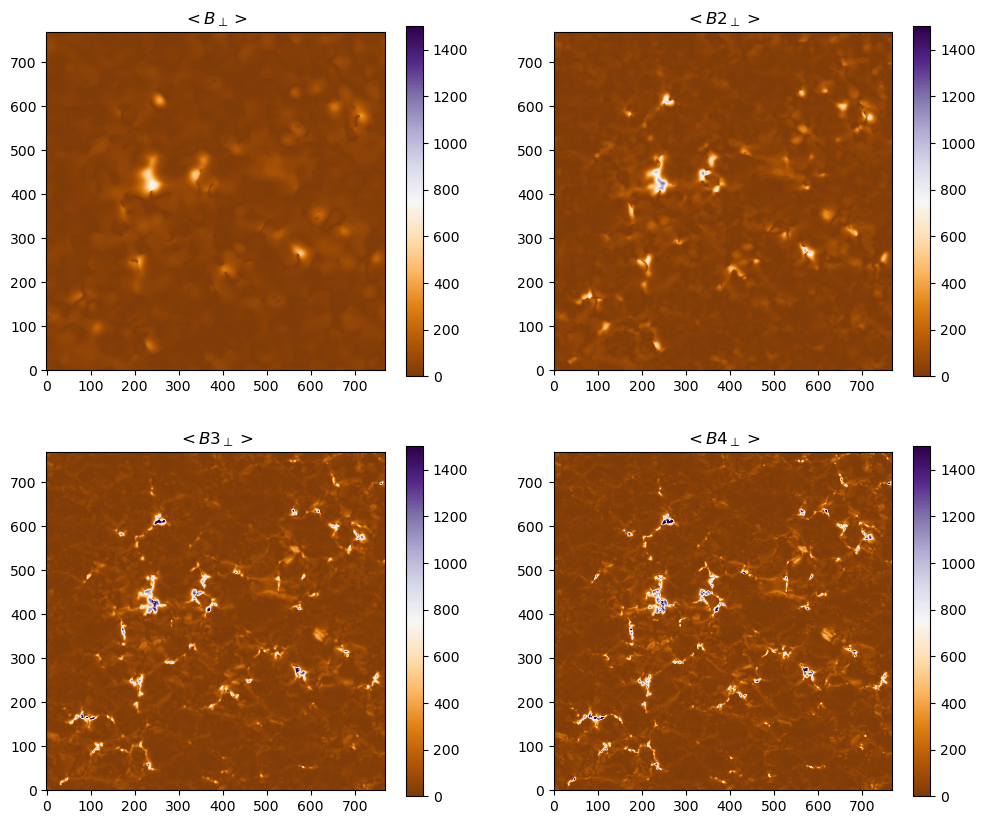

In [41]:
plt.figure(figsize=[12,10])
plt.subplot(221)
plt.imshow(Bh1[:,:],cmap='PuOr',origin='lower',vmax=1500)
plt.title(r'$<B_\bot>$')
plt.colorbar()
plt.subplot(222)
plt.imshow(Bh2[:,:],cmap='PuOr',origin='lower',vmax=1500)
plt.title(r'$<B2_\bot>$')
plt.colorbar()
plt.subplot(223)
plt.imshow(Bh3[:,:],cmap='PuOr',origin='lower',vmax=1500)
plt.title(r'$<B3_\bot>$')
plt.colorbar()
plt.subplot(224)
plt.imshow(Bh4[:,:],cmap='PuOr',origin='lower',vmax=1500)
plt.title(r'$<B4_\bot>$')
plt.colorbar()

In [32]:
print('Bh_0.1 = ',np.mean(Bh))
print('Bh_0.2 = ',np.mean(Bh2))
print('Bh_0.5 = ',np.mean(Bh3))
print('Bh_1.0 = ',np.mean(Bh4))

Bh_0.1 =  32.94686802883985
Bh_0.2 =  40.65447643287984
Bh_0.5 =  49.28790041275317
Bh_1.0 =  52.64796823143833


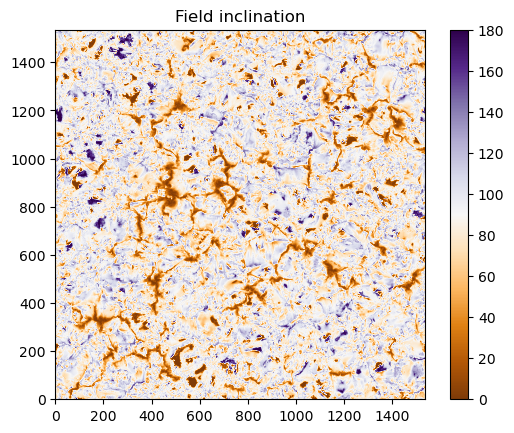

In [43]:
plt.imshow(model[:,:,1]*180./np.pi,cmap='PuOr',origin='lower')
plt.title("Field inclination")
plt.colorbar()

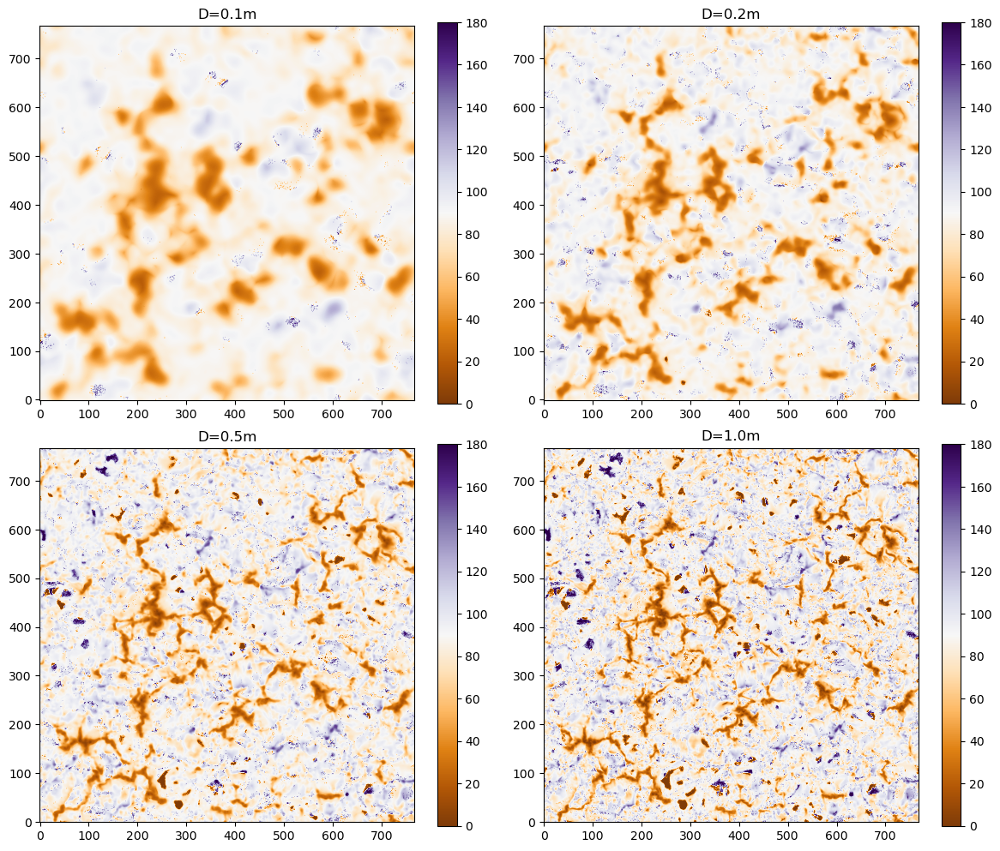

In [48]:
plt.figure(figsize=[12,10])
plt.subplot(221)
plt.imshow(model1[:,:,1]*180./np.pi,cmap='PuOr',origin='lower')
plt.title('D=0.1m')
plt.colorbar()
plt.subplot(222)
plt.imshow(model2[:,:,1]*180./np.pi,cmap='PuOr',origin='lower')
plt.title('D=0.2m')
plt.colorbar()
plt.subplot(223)
plt.imshow(model3[:,:,1]*180./np.pi,cmap='PuOr',origin='lower')
plt.title('D=0.5m')
plt.colorbar()
plt.subplot(224)
plt.imshow(model4[:,:,1]*180./np.pi,cmap='PuOr',origin='lower')
plt.title('D=1.0m')
plt.colorbar()
plt.tight_layout()

### Histogram for the inclination

In [122]:
gamma1 = model1[:,:,1]*180./np.pi
gamma1 = gamma1.flatten()
gamma2 = model2[:,:,1]*180./np.pi
gamma2 = gamma2.flatten()
gamma3 = model3[:,:,1]*180./np.pi
gamma3 = gamma3.flatten()
gamma4 = model4[:,:,1]*180./np.pi
gamma4 = gamma4.flatten()

(array([1.13385989e-02, 5.93397352e-05, 1.45994587e-04, 2.73151162e-04,
        3.55096511e-04, 4.85078788e-04, 6.21654369e-04, 7.45043342e-04,
        1.10861696e-03, 1.47407438e-03, 1.82822899e-03, 2.04486611e-03,
        2.05522702e-03, 2.09196114e-03, 1.96480457e-03, 1.87344021e-03,
        1.84518320e-03, 1.84706700e-03, 1.77359875e-03, 1.78678536e-03,
        1.75758644e-03, 1.75476074e-03, 1.77642446e-03, 1.79903007e-03,
        1.88191732e-03, 1.96103696e-03, 2.13811427e-03, 2.25302614e-03,
        2.46024426e-03, 2.59776174e-03, 2.70137080e-03, 3.00560469e-03,
        3.36352690e-03, 3.72615861e-03, 4.29129895e-03, 4.69725809e-03,
        5.57416751e-03, 6.49723006e-03, 7.37602328e-03, 8.54492188e-03,
        1.00161705e-02, 1.19301125e-02, 1.39373026e-02, 1.65077492e-02,
        1.94455370e-02, 2.29475233e-02, 2.62366401e-02, 3.02425432e-02,
        3.28817485e-02, 3.40949164e-02, 3.15376564e-02, 2.95662586e-02,
        2.64730571e-02, 2.29635356e-02, 1.89529231e-02, 1.548672

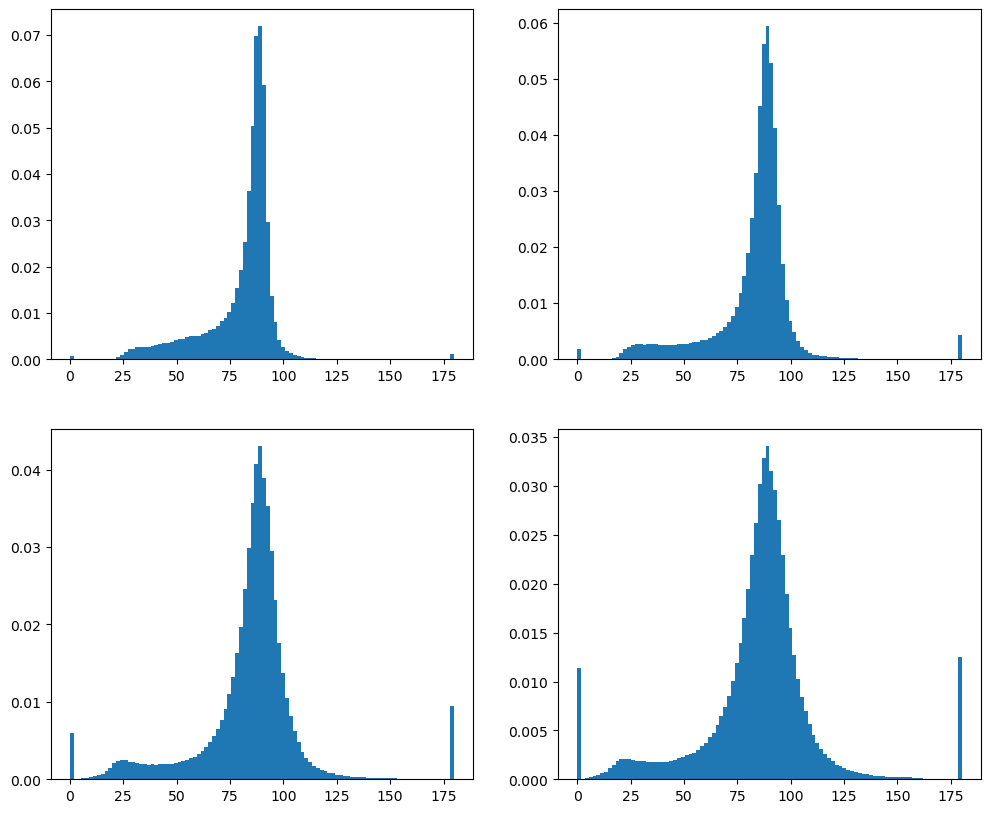

In [123]:
#q25, q75 = np.percentile(gamma, [25, 75])
#bin_width = 2 * (q75 - q25) *len(gamma) ** (-1/3)
#bins = round((gamma.max()-gamma.min())/ bin_width)
#bins
plt.figure(figsize=[12,10])
plt.subplot(221)
plt.hist(gamma1,density=True,bins=100)
plt.subplot(222)
plt.hist(gamma2,density=True,bins=100)
plt.subplot(223)
plt.hist(gamma3,density=True,bins=100)
plt.subplot(224)
plt.hist(gamma4,density=True,bins=100)

choose proper magnetic field

In [ ]:
#not finished
gamma = np.zeros(1)
for i in range(768):
    for j in range(768):
        if model[i,j,0] > 10:
            gamma  = gamma.append(model[i,j,1])
            

### 

In [79]:
stokes = fits.open('../data/qs_ph_disk_center_synth_converted_0.2b.fits')[0].data

In [93]:
x = np.zeros_like(stokes)
x.shape

(384, 384, 4, 201)

In [91]:
nx = stokes.shape[0]
ny = stokes.shape[1]
b = np.zeros([int(nx/2),int(ny/2),4,201])

for i in range(4):
    for j in range(201):
        b[:,:,i,j] = np.sum(stokes[:,:,i,j].reshape(int(nx/2),2,int(ny/2),2),axis=(1,3))/4.0

In [81]:
hdu = fits.PrimaryHDU(b)
hdu.writeto('../data/qs_ph_disk_center_synth_converted_0.2bb.fits')

In [82]:
modelb = fits.open('../data/qs_ph_disk_center_synth_converted_0.2b_inverted.fits')[0].data
modelbb = fits.open('../data/qs_ph_disk_center_synth_converted_0.2bb_inverted.fits')[0].data

In [83]:
Bz2b = modelb[:,:,0]*np.cos(modelb[:,:,1])
Bz2bb = modelbb[:,:,0]*np.cos(modelbb[:,:,1])


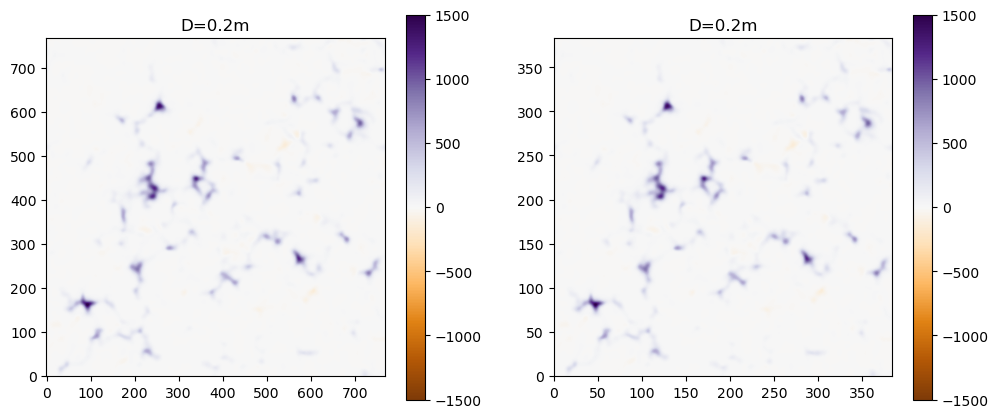

In [74]:
plt.figure(figsize=[12,5])
plt.subplot(121)
plt.imshow(Bz2[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('D=0.2m')
plt.colorbar()
plt.subplot(122)
plt.imshow(Bz2b[:,:],cmap='PuOr',origin='lower',vmin=-1500,vmax=1500)
plt.title('D=0.2m')
plt.colorbar()

In [75]:
np.mean(Bz2b)

23.552802518505068

In [84]:
np.mean(Bz2bb)

23.373868474294287

In [94]:
np.mean(Bz2)

23.597892968206196

### test for tranform simulated pixel size to real telescope size.
We need to change our data from 16km for one pixel to 58km for one pixel.
Two different thoughts: bin first 16x3=48 then interpolate to get the corresponding value;
                        do interpolate using original dataset.

In [179]:
import warnings
warnings.filterwarnings('ignore')

In [124]:
stokes = fits.open('../data/qs_ph_disk_center_synth.fits')[0].data
stokes.shape

(1536, 1536, 4, 201)

(1536, 1536)

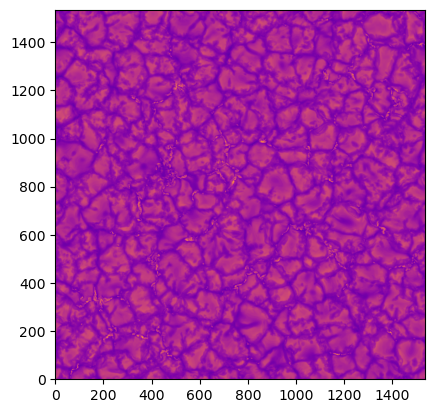

In [128]:
test = stokes[:,:,0,190]
plt.imshow(test[:,:],origin='lower',cmap='plasma')
test.shape

First, bin by 3.

In [129]:
nx = test.shape[0]
ny = test.shape[1]

tb = np.sum(test[:,:].reshape(round(nx/3),3,round(ny/3),3),axis=(1,3))/9.0

In [147]:
tb.shape

(512, 512)

In [161]:
x = np.linspace(0,511,512)
y = np.linspace(0,511,512)
f = interp2d(x,y,tb)

/tmp/ipykernel_3747406/1626778197.py:3: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://scipy.github.io/devdocs/notebooks/interp_transition_guide.html`

  f = interp2d(x,y,tb)


In [180]:
X = np.linspace(0,511,423)
f(X,X)

array([[1.13619876, 1.11731533, 1.03706413, ..., 1.13198373, 1.11831076,
        1.11892356],
       [1.23717647, 1.24382239, 1.15130756, ..., 1.22301813, 1.18840829,
        1.19880922],
       [1.32806728, 1.34651673, 1.29566747, ..., 1.20646996, 1.21628598,
        1.28722283],
       ...,
       [0.88771907, 0.87947532, 0.87860712, ..., 0.94177812, 0.93953547,
        0.91027633],
       [0.9726449 , 0.96142249, 0.89540509, ..., 1.00000624, 0.989731  ,
        0.96810994],
       [1.04567888, 1.0600163 , 0.96968023, ..., 0.98709404, 0.98404885,
        1.01960665]])

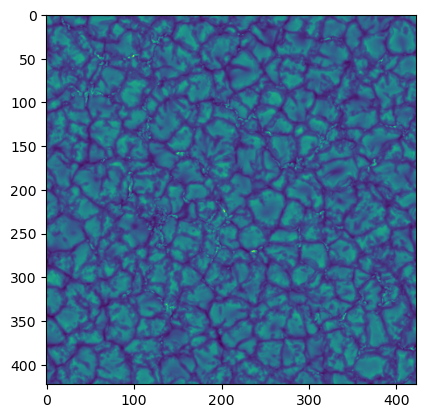

In [181]:
plt.imshow(f(X,X))

In [182]:
np.std(f(X,X))

0.15727402363860185

In [159]:
np.std(test)

0.16439690941572477

Second, interpolate with whole data.

In [162]:
x = np.arange(1536)
y = np.arange(1536)
f2 = interp2d(x,y,test)

/tmp/ipykernel_3747406/469628507.py:3: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://scipy.github.io/devdocs/notebooks/interp_transition_guide.html`

  f2 = interp2d(x,y,test)


In [176]:
Y = np.linspace(0,1533,423)
f2(Y,Y)

/tmp/ipykernel_3747406/1169298268.py:2: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://scipy.github.io/devdocs/notebooks/interp_transition_guide.html`

  f2(Y,Y)


array([[1.07601404, 1.11903315, 1.0609256 , ..., 1.11755006, 1.07986095,
        1.05839801],
       [1.20029253, 1.22860699, 1.13741773, ..., 1.24377465, 1.1971998 ,
        1.17935759],
       [1.30738984, 1.33880473, 1.31388953, ..., 1.22607173, 1.16708078,
        1.22450217],
       ...,
       [0.87928692, 0.86321275, 0.87492752, ..., 0.91224617, 0.90645928,
        0.907347  ],
       [0.94345937, 0.93231708, 0.88744027, ..., 1.00776529, 1.02006196,
        0.94863766],
       [1.02592194, 1.05918442, 0.94805205, ..., 0.98684711, 0.9856436 ,
        0.99348098]])

In [172]:
ib = np.sum(f2(Y,Y)[:,:].reshape(round(nx/3),3,round(ny/3),3),axis=(1,3))/9.0

/tmp/ipykernel_3747406/1058571663.py:1: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://scipy.github.io/devdocs/notebooks/interp_transition_guide.html`

  ib = np.sum(f2(Y,Y)[:,:].reshape(round(nx/3),3,round(ny/3),3),axis=(1,3))/9.0


/tmp/ipykernel_3747406/1110680825.py:1: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://scipy.github.io/devdocs/notebooks/interp_transition_guide.html`

  plt.imshow(f2(Y,Y))


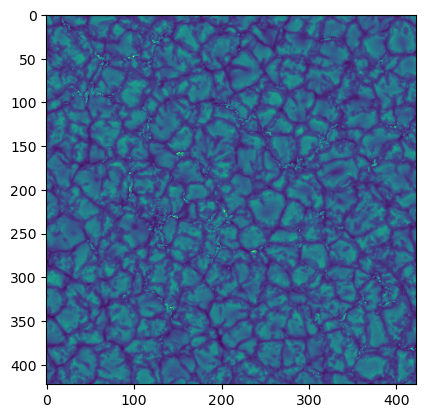

In [177]:
plt.imshow(f2(Y,Y))

In [193]:
np.std(f2(Y,Y))

0.16339268610061514

### Results, just taking points

In [197]:
np.mean(f2(Y,Y)-f(X,X)) #f:bin then interp; f2: directly interp

-2.227821714551166e-05

In [203]:
np.mean(f(X,X))

1.0223364515500881

In [194]:
print(np.std(f(X,X)))
print(np.std(f2(Y,Y)))

0.15727402363860185
0.16339268610061514


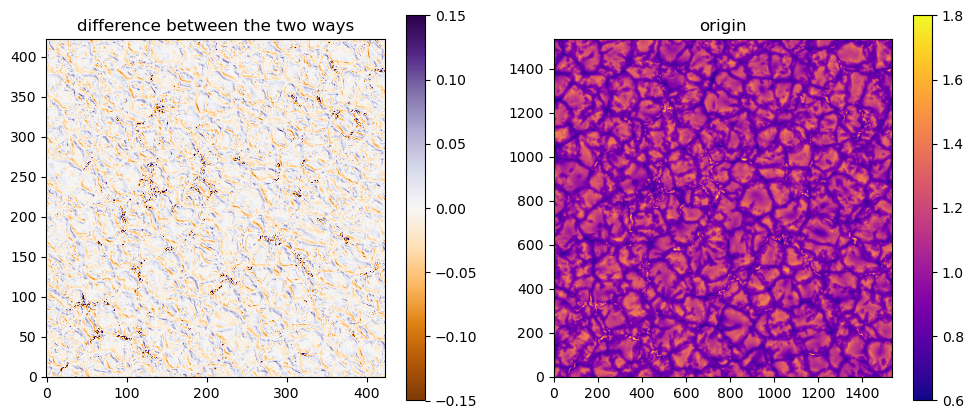

In [211]:
plt.figure(figsize=[12,5])
plt.subplot(121)
plt.imshow(f2(Y,Y)-f(X,X),origin='lower',cmap='PuOr',vmin=-0.15,vmax=0.15)
plt.title('difference between the two ways')
plt.colorbar()
plt.subplot(122)
plt.imshow(test,origin='lower',cmap='plasma',vmin=0.6,vmax=1.8)
plt.title('origin')
plt.colorbar()

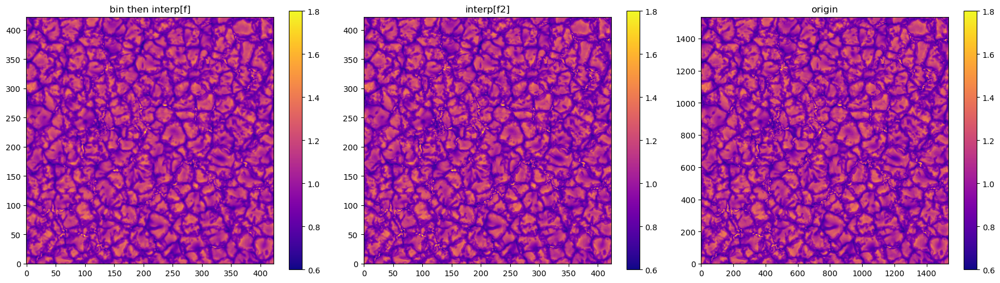

In [210]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(f(X,X),origin='lower',cmap='plasma',vmin=0.6,vmax=1.8)
plt.title('bin then interp[f]')
plt.colorbar()
plt.subplot(132)
plt.imshow(f2(Y,Y),origin='lower',cmap='plasma',vmin=0.6,vmax=1.8)
plt.title('interp[f2]')
plt.colorbar()
plt.subplot(133)
plt.imshow(test,origin='lower',cmap='plasma',vmin=0.6,vmax=1.8)
plt.title('origin')
plt.colorbar()
plt.tight_layout()